In [1]:
#!/usr/bin/env python
# -*- encoding: utf-8

#from geopy.distance import great_circle as great_circle_old
from datetime import datetime as dt, timedelta as td
import numpy as np
from numpy import loadtxt

import sparse
from scipy.sparse import dok_matrix
import time
from timeit import default_timer as timer
import yaml
#from Cluster_functions import read_file, read_file_clim, dt_array

with open("Options.yaml") as f:
    Options = yaml.safe_load(f)

#Specific functions related to the clustering algorithm
from Cluster_functions import *
from dynlib.metio.erainterim import conf, dt, get_instantaneous, metsave, metopen

#Plotting related
import matplotlib.pyplot as plt
import matplotlib as mpl
import dynlib.proj as proj
import dynlib.figures as fig
import copy
from cmocean import cm as cmoc
from mpl_toolkits.basemap import Basemap
import os

clustchar = "nolength" #length" #"All" #"length""nolength" or "all"
minstorms = 2
distchar = "250km"
calcDensityEI = False

# PLOTTING SETTINGS "
scale_density = np.arange(3,25,1)
scale_anomaly = np.arange(-5,5.1,1)
scale_anomaly_perc = np.arange(-40,40,5)
cmap_IMILAST = (mpl.colors.ListedColormap(["yellow","orange","green","lightblue","blue","darkblue","midnightblue","purple","red"])
        .with_extremes(over='grey', under='white'))
scale_IMILAST = [2,5,10,15,20,25,35,50,70,100]
scale_clust = [0.5,1.0,2.0,3.0,4.0,6.0,9.0,12.0,15.0,20.0]
colors_clust = ["white","yellow","orange","green","dodgerblue","red","grey"]
norm = mpl.colors.BoundaryNorm(scale_IMILAST, cmap_IMILAST.N)
colors_IMILAST=["white","yellow","orange","green","deepskyblue","dodgerblue","royalblue","midnightblue","purple","red","grey"]

def n_hemisphere_new():
        ''' Stereographic map, centered on the north pole, covering most of the northern hemisphere

        Returns
        -------
        Basemap
                map projection instance
        '''

        return Basemap(projection='npstere',boundinglat=27.5,lon_0=0,resolution='c', area_thresh=50000)

def s_hemisphere_new():
        ''' Stereographic map, centered on the north pole, covering most of the northern hemisphere

        Returns
        -------
        Basemap
                map projection instance
        '''

        return Basemap(projection='spstere',boundinglat=-27.5,lon_0=0,resolution='c', area_thresh=50000)

ncmask, landmask, maskgrid = metopen("ei.ans.land-sea",q="lsm")
ncoro, oro, orogrid = metopen("ei.ans.orog",q="z")
oro /= 9.81
oro = np.roll(oro,360,-1)
nrtimes = 90*4*(2014-1979 + 1)

figsize = (10,9)

Found ./ei.ans.land-sea.nc
Found ./ei.ans.orog.nc


In [2]:

grid = copy.copy(maskgrid)
grid.x = maskgrid.x[::3,::3] + 180.0 #[0:60,::]
grid.y = maskgrid.y[::3,::3] #[0:60,::]
grid.dx = maskgrid.dx[::3,::3] #[0:60,::]
grid.dy = maskgrid.dy[::3,::3] #[0:60,::]
grid.oro = maskgrid.oro[::3,::3] #[0:60,::]
grid.nx = 240
grid.ny = 121 #60
conf.gridsize = (121,240) #(60,240)

def calc_density():
    #Construct grid
    import copy
    grid = copy.copy(maskgrid)
    grid.x = maskgrid.x[::3,::3] + 180.0#[0:60,::]
    grid.y = maskgrid.y[::3,::3] #[0:60,::]
    grid.dx = maskgrid.dx[::3,::3] #[0:60,::]
    grid.dy = maskgrid.dy[::3,::3] #[0:60,::]
    grid.oro = maskgrid.oro[::3,::3] #[0:60,::]
    grid.nx = 240
    grid.ny = 121 #60
    conf.gridsize = (121,240) #(60,240)

    #Define arrays
    lats = np.arange(90,-90.1,-1.5)
    lons = np.arange(0,360,1.5)
    mean_storms = np.zeros((len(lats),len(lons))) #Cyclone centre density
    mean_tracks = np.zeros((len(lats),len(lons))) #Track density
    mean_lysis  = np.zeros((len(lats),len(lons))) #Track density
    mean_genesis  = np.zeros((len(lats),len(lons))) #Track density

    for latidx in range(len(lats)):
        print(" Lat: " + str(lats[latidx]))
        for lonidx in range(len(lons)):
            min_lat = np.nanmax([-90.0,lats[latidx] - 1.5])
            max_lat = np.nanmin([90.0,lats[latidx] + 1.5])
            min_lon = lons[lonidx] - 1.5
            max_lon = lons[lonidx] + 1.5
            if((min_lon >= 0.0) & (max_lon <= 360.0)):
                temp_id = str_id[(str_lat >= min_lat) & (str_lat <= max_lat) & (str_lon >= min_lon) & (str_lon <= max_lon)]
                temp_lon = str_lon[(str_lat >= min_lat) & (str_lat <= max_lat) & (str_lon >= min_lon) & (str_lon <= max_lon)]
                temp_lat = str_lat[(str_lat >= min_lat) & (str_lat <= max_lat) & (str_lon >= min_lon) & (str_lon <= max_lon)]
                areaidxs = (grid.y >=  min_lat) & (grid.y <= max_lat) & (grid.x  >= min_lon) & (grid.x <= max_lon)
            elif(min_lon < 0.0):
                temp_id = str_id[(str_lat >= min_lat) & (str_lat <= max_lat) &  (str_lon <= max_lon) | (str_lat >= min_lat) & (str_lat <= max_lat) &  (str_lon >= min_lon  + 360.0)]
                areaidxs = (grid.y >=  min_lat) & (grid.y <= max_lat)  & (grid.x  <= max_lon) | (grid.y >=  min_lat) & (grid.y <= max_lat) & (grid.x >= min_lon + 360.0) 
            elif(max_lon > 360.0):
                temp_id = str_id[(str_lat >= min_lat) & (str_lat <= max_lat) & (str_lon >= min_lon) | (str_lat >= min_lat) & (str_lat <= max_lat) & (str_lon <= max_lon - 360.0)]
                areaidxs = (grid.y >=  min_lat) & (grid.y <= max_lat)  & (grid.x  >= min_lon) | (grid.y >=  min_lat) & (grid.y <= max_lat) & (grid.x <= max_lon - 360.0)
            else:
                print("I should not be here")
            diff_lon = 3.0
            #area = np.abs((max_lat - min_lat)*diff_lon)*np.cos((min_lat+max_lat)/2.*np.pi/180.)*111111**2 #
            area = np.nansum(np.abs(grid.dy[areaidxs]*grid.dx[areaidxs]))

            mean_storms[latidx,lonidx] = len(temp_id)/(area*nrtimes)*10**12
            mean_tracks[latidx,lonidx] = len(np.unique(temp_id))/(area*nrtimes)*10**12
            
    return mean_storms, mean_tracks
    
#Construct array with datetimes
dt_array = []
for yidx in range(1979,2017):

    # To get year (integer input) from the user
    # year = int(input("Enter a year: "))
    if ((yidx + 1) % 4) == 0:
        leapyear = True
        nr_times = 364 #366*4 #(whole year) 364 (just winter)
    else:
        leapyear = False
        nr_times = 360 #365*4 #(whole year) 360 (just winter)

    start = dt(yidx, 12, 1, 0) #(just winter)

    dt_array_temp = np.array([start + td(hours=i*6) for i in range(nr_times)])
    dt_array.extend(dt_array_temp)

def calc_density_radius(distchar = "250km", dist_thresh=250, connect=False, save=False, outfile="Density.npz"):
    #Define arrays
    lats = np.arange(90,-90.1,-1.5)
    lons = np.arange(0,360,1.5)

    ################################
    # Get indices of storms 
    # so that ids_storms[id] gives the ids in the arrays
    # str_id, str_lon,.. belonging to that specific storm
    #########################
    uniq_ids = np.unique(str_id)
    ids_storms = get_indices_sparse(str_id)
    nrstorms = len(uniq_ids)

    #Define arrays
    storms = np.zeros((len(dt_array),len(lats),len(lons))) #Cyclone centre density
    tracks = np.zeros((len(dt_array),len(lats),len(lons))) #Track density
    lysis  = np.zeros((len(dt_array),len(lats),len(lons))) #Track density
    genesis  = np.zeros((len(dt_array),len(lats),len(lons))) #Track density
    
    mean_storms_seas = np.zeros((4,len(lats),len(lons)))
    mean_tracks_seas = np.zeros((4,len(lats),len(lons)))
    mean_genesis_seas = np.zeros((4,len(lats),len(lons)))
    mean_lysis_seas = np.zeros((4,len(lats),len(lons)))

    #Loop over storm_tracks
    #nr_storms = np.max(str_id)

    if(distchar != "Rossby"):
        dist_temp = dist_thresh

    #Loop over storms
    for strid in range(nrstorms): #clust_idxs: #range(1,nr_storms+1):
        print("Storm: " + str(strid))
        if(connect):
            temp_conn = str_connected[ids_storms[uniq_ids[strid]]]
            temp_lat = str_lat[ids_storms[uniq_ids[strid]]][temp_conn >= 1]
            temp_lon = str_lon[ids_storms[uniq_ids[strid]]][temp_conn >= 1]
            temp_dt  = str_dt[ids_storms[uniq_ids[strid]]][temp_conn >= 1]
        else:
            temp_lat = str_lat[ids_storms[uniq_ids[strid]]]
            temp_lon = str_lon[ids_storms[uniq_ids[strid]]]
            temp_dt  = str_dt[ids_storms[uniq_ids[strid]]]
        #temp_vort = str_vort[ids_storms[uniq_ids[strid]]]
        #temp_maxvort = np.nanmax(str_vort[ids_storms[uniq_ids[strid]]])

        lngth = len(temp_dt)

        #Switch to prevent double counting	
        bool_tracks   = np.full((len(lats),len(lons)),False)

        #Loop over times
        for tridx in range(len(temp_dt)):
            #print("Idx: " + str(tridx))

            #Find time index for current time of storm track in result array
            if (temp_dt[tridx] in dt_array):
                tidx = dt_array.index(temp_dt[tridx])
                #Loop over lons and lats
                for latidx in range(len(lats)):
                    lattemp = np.abs(lats[latidx])
                    if(distchar == "Rossby"):
                        if(lattemp > 20):
                            dist_temp = np.abs(calc_Rossby_radius(lat=lattemp))
                        else:
                            dist_temp = calc_Rossby_radius(lat=20.0)
                    if(np.abs(temp_lat[tridx] - lats[latidx]) <= dist_temp/111): 
                        for lonidx in range(len(lons)):
                            #Calculate distance to grid point
                            dist = great_circle(temp_lat[tridx],temp_lon[tridx], lats[latidx],lons[lonidx])

                            #If distance is < 500 km increase nr. of storms
                            if ((dist < dist_temp)): 
                                storms[tidx,latidx,lonidx] += 1
                                if(bool_tracks[latidx,lonidx] == False):
                                    tracks[tidx,latidx,lonidx] += 1
                                if(tridx == 0):
                                    genesis[tidx,latidx,lonidx] += 1
                                if(tridx == len(temp_dt) - 1):	
                                    lysis[tidx,latidx,lonidx] += 1

                                bool_tracks[latidx,lonidx] = True   

    if(distchar != "Rossby"):
        mul_fac = (500/dist_thresh)**2.0*4.0/np.pi

    #Loop over lons and lats
    if(distchar =="Rossby"):
        mul_fac = np.zeros(conf.gridsize)
        for latidx in range(len(lats)):
            lattemp = np.abs(lats[latidx])
            Rossby_temp = calc_Rossby_radius(lat=lattemp)
            mul_fac[latidx,:] = (500/Rossby_temp)**2.0*4.0/np.pi

    mean_storms = np.nanmean(storms,axis=0)*mul_fac
    mean_tracks = np.nanmean(tracks,axis=0)*mul_fac
    mean_genesis = np.nanmean(genesis,axis=0)*mul_fac
    mean_lysis = np.nanmean(lysis,axis=0)*mul_fac
    
    ## seasonal differences ##
    seasons = ["DJF","MAM","JJA","SON"]
    
    i=0
    for season in seasons:
        months = np.array([x.month for x in dt_array])
        if(season == "DJF"):
            selidxs = (months < 3) | (months >= 12)
        elif(season == "MAM"):
            selidxs = (months < 6) | (months >= 3)
        elif(season == "JJA"):
            selidxs = (months < 9) | (months >= 6)
        elif(season == "SON"):
            selidxs = (months < 12) | (months >= 8)

        mean_storms_seas[i,::] = np.nanmean(storms[selidxs,::],axis=0)
        mean_tracks_seas[i,::] = np.nanmean(tracks[selidxs,::],axis=0)
        mean_genesis_seas[i,::] = np.nanmean(genesis[selidxs,::],axis=0)
        mean_lysis_seas[i,::]   = np.nanmean(lysis[selidxs,::],axis=0)
        i+=1 
        
    ## Optionally saving results
    if(save):
        np.savez(outfile, 
        #storms=storms,
        #tracks=tracks,
        #genesis=genesis,
        #lysis=lysis,
        #yearly means
        mean_storms=mean_storms,
        mean_tracks=mean_tracks,
        mean_genesis=mean_genesis,
        mean_lysis=mean_lysis,
        #Seasonal means
        mean_storms_seas=mean_storms_seas,
        mean_tracks_seas=mean_tracks_seas,
        mean_genesis_seas=mean_genesis_seas,
        mean_lysis_seas=mean_lysis_seas)
 
    return mean_storms, mean_tracks, mean_genesis, mean_lysis, mean_storms_seas, mean_tracks_seas, mean_genesis_seas, mean_lysis_seas


In [3]:

#ERA 5 Densities calculation  #######
datachar = "EI"
st_file_ei = "Tracks/Selected_tracks_1979to2018_0101to1231_ei_Globe_Leonidas_with_stationary_all"
str_id, str_nr, str_dt, str_lat, str_lon = read_file(st_file_ei)
str_dt = np.array(str_dt)

#Save density
outfile="Density/Density_" + datachar + "_" + distchar + ".npz"
#np.savez(outfile, mean_storms=mean_storms_ei, mean_tracks=mean_tracks_ei,mean_genesis=mean_genesis_ei,mean_lysis=mean_lysis_ei)

if(calcDensityEI):
    #Density
    mean_storms_ei, mean_tracks_ei, mean_genesis_ei, mean_lysis_ei, mean_storms_seas_ei, mean_tracks_seas_ei, mean_genesis_seas_ei, mean_lysis_seas_ei = calc_density_radius(save=True, outfile=outfile)
else:
    ResultsDensity = np.load(outfile)
    mean_storms_ei = ResultsDensity["mean_storms"]
    mean_tracks_ei = ResultsDensity["mean_tracks"]
    mean_storms_seas_ei = ResultsDensity["mean_storms_seas"]
    mean_genesis_seas_ei = ResultsDensity["mean_genesis_seas"]




In [4]:
clustchar = "All"
minstorms = 2
######################################################
# load clustering results
######################################################
formatter =  "{:1.1f}"
infile = Options["outdir"] +  Options["str_result"]  + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"]) + ".npz"
Results = np.load(infile,allow_pickle=True)
 
# All clusters
sorted_clusters = Results["sorted_clusters"]

# Only Subclusters (length or nolength)
sorted_subclusters = Results["sorted_subclusters_nolength"]
sorted_clusters_nolength = sorted(unnest(sorted_subclusters))
sorted_subclusters = Results["sorted_subclusters_length"]
sorted_clusters_length = sorted(unnest(sorted_subclusters))

#Get str_connected
str_connected = Results["str_connected"]

#Filter clusterd storms
strmidxs = np.unique(str_id)
clststroms = [strm for cluster in sorted_clusters for strm in cluster if len(cluster) >= minstorms and strm in strmidxs]
clststroms = sorted(clststroms)
len(clststroms)
len(clststroms)/np.nanmax(str_id)
######################################################
# load density results All
######################################################
#outfileClust ="Density/Density_" +\
#        datachar + "_" + distchar + "_Clust_" + clustchar + "_minstorms_" + str(minstorms) + "_connect.npz"
outfileClust="Density/Density_" + "_" + distchar + "_" +\
        Options["str_result"]  + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"    ]) +\
        "_Clust_" + clustchar + "_minstorms_" + str(minstorms) + "_connect.npz"

ResultsDensityClust = np.load(outfileClust)
mean_storms_clst_ei = ResultsDensityClust["mean_storms"]
mean_tracks_clst_ei = ResultsDensityClust["mean_tracks"]
mean_storms_seas_clst_ei = ResultsDensityClust["mean_storms_seas"]
mean_genesis_clst_ei = ResultsDensityClust["mean_genesis_seas"]

######################################################
# load density results length
######################################################
clustchar = "length"
minstorms = 2

outfileClust="Density/Density_" + "_" + distchar + "_" +\
        Options["str_result"]  + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"    ]) +\
        "_Clust_" + clustchar + "_minstorms_" + str(minstorms) + "_connect.npz"

ResultsDensityClust_length = np.load(outfileClust)
mean_storms_clst_ei_length = ResultsDensityClust_length["mean_storms"]
mean_tracks_clst_ei_length = ResultsDensityClust_length["mean_tracks"]
mean_storms_seas_clst_ei_length = ResultsDensityClust_length["mean_storms_seas"]
mean_genesis_clst_ei_length = ResultsDensityClust_length["mean_genesis_seas"]

######################################################
# load density results nolength
######################################################
clustchar = "nolength"

outfileClust="Density/Density_" + "_" + distchar + "_" +\
        Options["str_result"]  + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"    ]) +\
        "_Clust_" + clustchar + "_minstorms_" + str(minstorms) + "_connect.npz"

ResultsDensityClust_nolength = np.load(outfileClust)
mean_storms_clst_ei_nolength = ResultsDensityClust_nolength["mean_storms"]
mean_tracks_clst_ei_nolength = ResultsDensityClust_nolength["mean_tracks"]
mean_storms_seas_clst_ei_nolength = ResultsDensityClust_nolength["mean_storms_seas"]
mean_genesis_clst_ei_nolength = ResultsDensityClust_nolength["mean_genesis_seas"]

######################################################
# load other results (sparse matrices)
######################################################
from scipy.sparse import load_npz
infile = Options["outdir"] +  Options["str_result"]  + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"]) 
dtTracks = load_npz(infile + "_dtTracks.npz")
drTracks = load_npz(infile + "_drTracks.npz")
connTracks = load_npz(infile + "_connTracks.npz")

#Convert to dok_matrix to make subscriptable
connTracks = connTracks.todok()
dtTracks = dtTracks.todok()
drTracks = drTracks.todok()


In [5]:
infileClustNew = Options["outdir"] +  Options["str_result"] + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"]) + "_timlength_" + formatter.format( Options["timlngthresh"]*6.0) + "_AlongTracks"  + ".npz"

ResultsNew = np.load(infileClustNew,allow_pickle=True)
 
# All clusters
sorted_clustersNew = ResultsNew["sorted_clusters"]
sorted_subclustersNew = ResultsNew["sorted_subclusters_nolength"]
sorted_clusters_nolengthNew = sorted(unnest(sorted_subclustersNew))
sorted_subclustersNew = ResultsNew["sorted_subclusters_length"]
sorted_clusters_lengthNew = sorted(unnest(sorted_subclustersNew))

lengths = [len(x) for x in sorted_clusters_lengthNew if len(x) >= 2]
print(np.nansum(lengths))

lengths = [len(x) for x in sorted_clusters_nolengthNew if len(x) >= 2]
print(np.nansum(lengths))

lengths = [len(x) for x in sorted_clusters_length if len(x) >= 2]
print(np.nansum(lengths))

lengths = [len(x) for x in sorted_clusters_nolength if len(x) >= 2]
print(np.nansum(lengths))

57519
15433
49633
21827


In [9]:
lengths = [len(x) for x in sorted_clusters if len(x) >= 3]
np.nansum(lengths)

49048

In [120]:
lengths = [len(x) for x in sorted_clusters if len(x) >= 2]
np.nansum(lengths)/137070

0.47755161596264684

In [52]:
#########################
# Get indices of storms 
# so that ids_storms[id] gives the ids in the arrays
# str_id, str_lon,.. belonging to that specific storm
#########################
uniq_ids = np.unique(str_id)
ids_storms = get_indices_sparse(str_id)
nrstorms = len(uniq_ids)


In [65]:
cluster = sorted_clusters[2]

#find_cluster_type_dokm([0],connTracks,contype="NoLength")
print(cluster)
for strid in cluster:  
        #Convert strid to index
        stridx = [i for i in range(len(uniq_ids)) if uniq_ids[i] == strid]
        print(stridx)
        
        clusttemp = find_cluster_type_dokm(stridx,connTracks,contype="Length")
        print(clusttemp)
        clusttemp = [uniq_ids[x] for x in clusttemp] #Convert indices to storm id
        
        print(clusttemp)


[4, 26, 28, 31, 33, 38, 48]
[3]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]
[25]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]
[27]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]
[30]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]
[32]
[32]
[33]
[37]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]
[47]
[ 3 25 27 30 37 47]
[4, 26, 28, 31, 38, 48]


In [80]:
#dtTracks[30,47]

1.4166666666666667

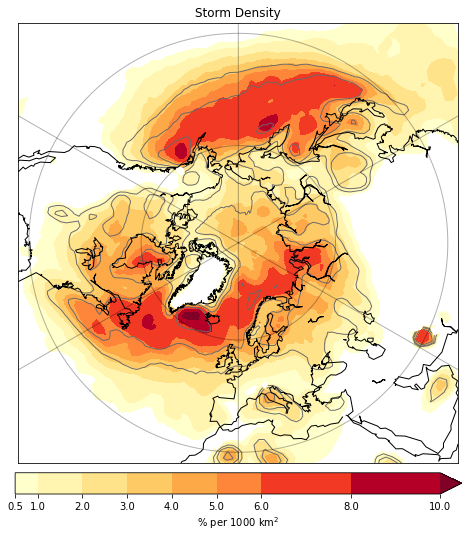

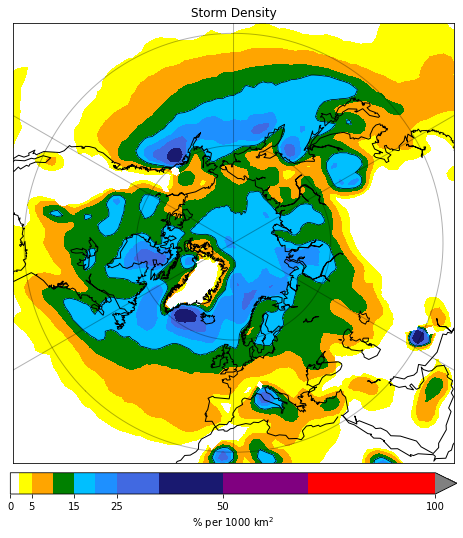

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide


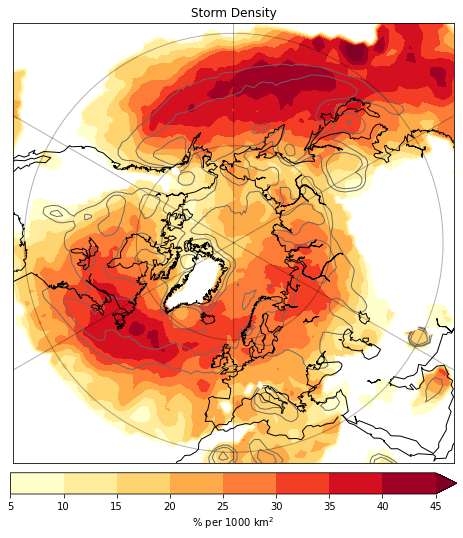

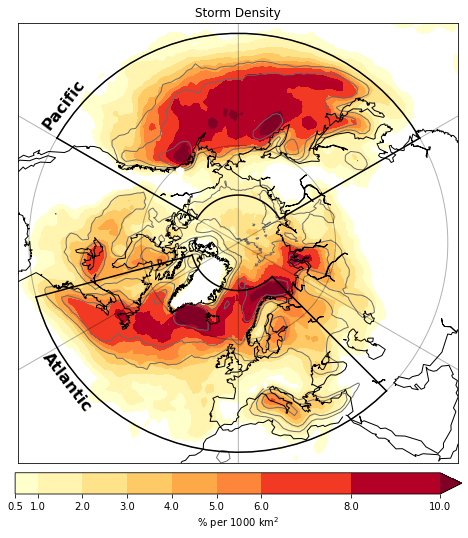

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: invalid value encountered in true_divide


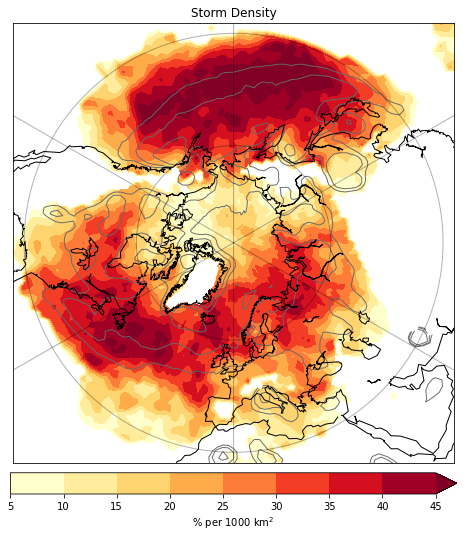

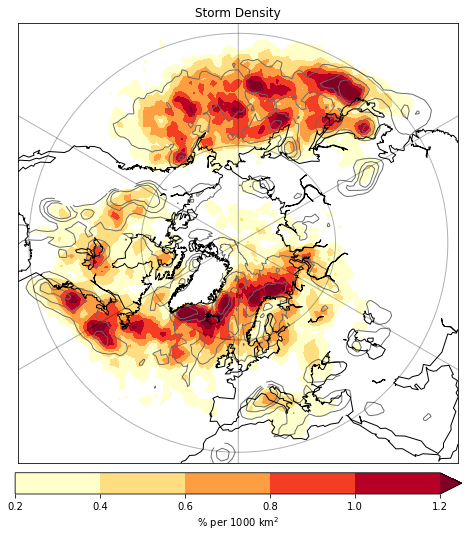

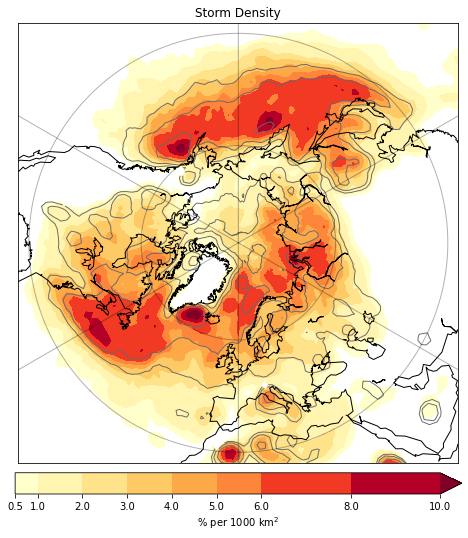

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: invalid value encountered in true_divide


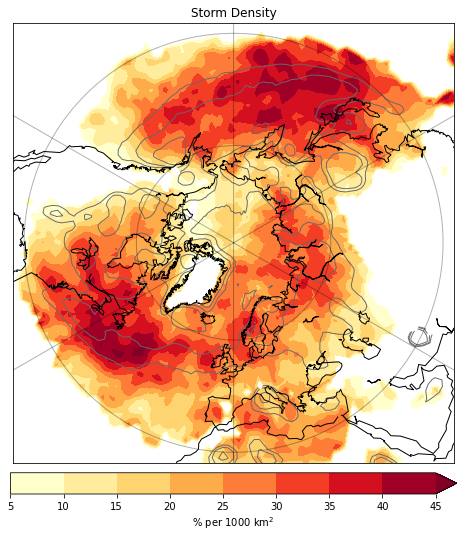

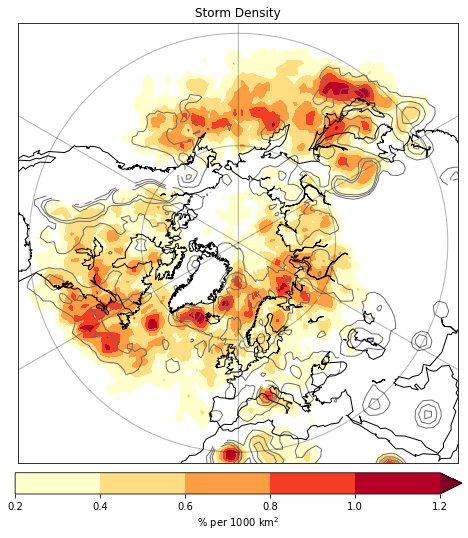

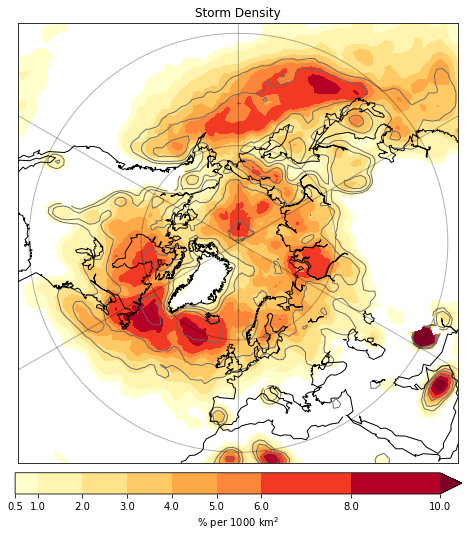

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: invalid value encountered in true_divide


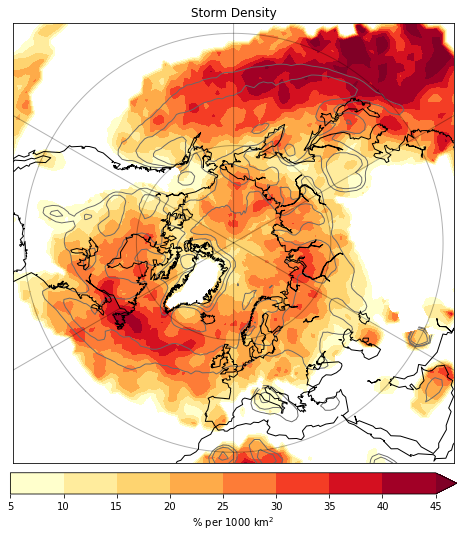

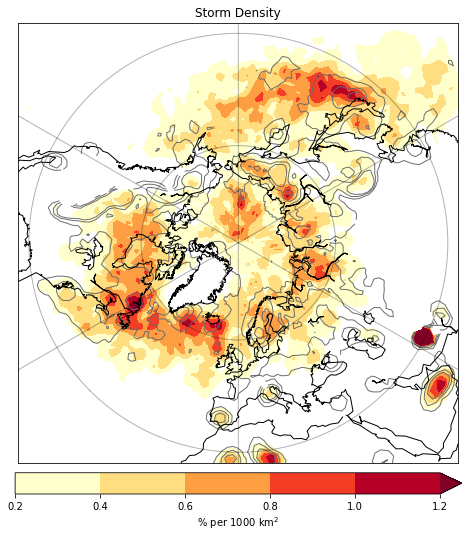

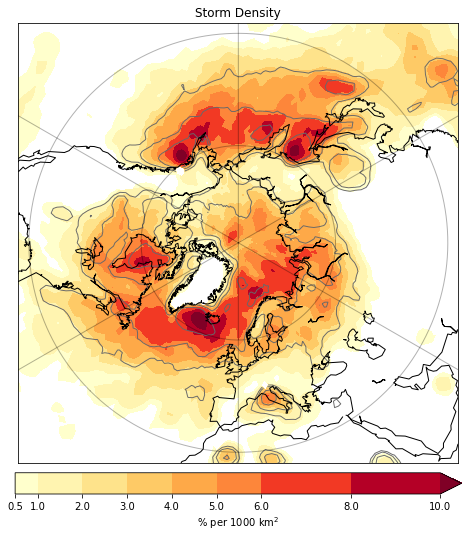

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: invalid value encountered in true_divide


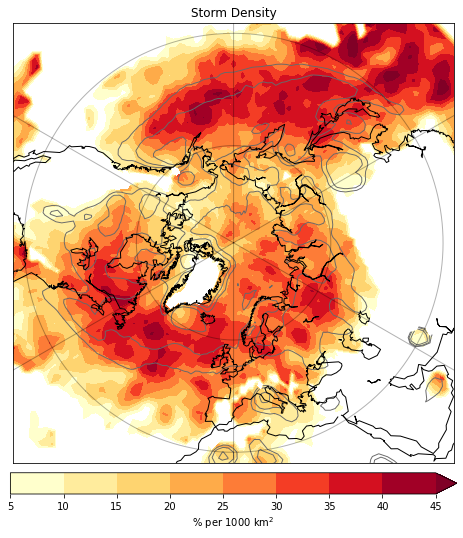

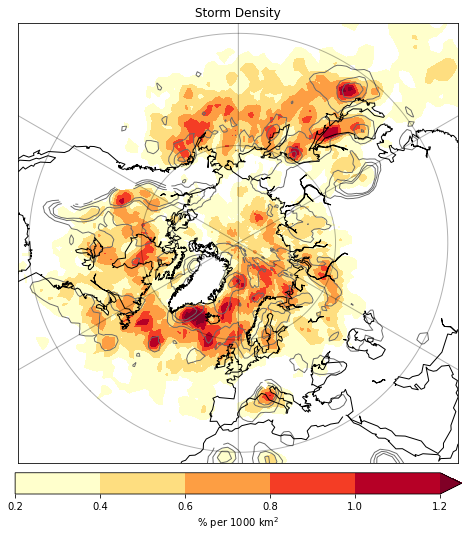

In [42]:
clustchar = "All"
%matplotlib inline

clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0

genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

normal_scale = [1.0,2.0,4.0,6.0,9.0,12.0,16.0,20.0,25.0,30.0,40.0,50.0] #16.0,20.0,25.0,30.0
imilast_scale = [0.0,2.0,5.0,10.0,15.0,20.0,25.0,35.0,50.0,70.0,100.0]

frac_scale = [5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,45.0]

seasons = ["DJF","MAM","JJA","SON"]

'''
plt.figure() 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', scale=[15], linewidths=0.75)] 
fig.map(mean_storms_clst_ei[::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density",colors=colors_IMILAST, scale=clust_scale, cmap=None, #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")

'''

plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')] 
fig.map(mean_storms_clst_ei[::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', scale=[15], linewidths=0.75)] 
fig.map(mean_storms_ei[::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density",cmap=None,colors=colors_IMILAST, scale=imilast_scale, #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


perc_storms = mean_storms_clst_ei[::,::]/mean_storms_ei[::,::]*100*(mean_storms_ei[::,::]*100.0 > 2.0)
plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')] 
fig.map(perc_storms,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Frac_Density_ERA5_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")

#,colors=colors_IMILAST,

for s in range(len(seasons)):
    plt.figure(figsize=figsize)
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]
    #Add regions if plotting DJF season
    if(s==0):
        overlays.extend([fig.map_overlay_latlonbox(-75, 45, 75, 30,color="black"),
           fig.map_overlay_latlonbox(120, 240, 75, 30,color="black"),
           fig.map_overlay_text(-55,22.5,"Atlantic",rotation=-52.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold'), ##5A5A5A"
           fig.map_overlay_text(235,22.5,"Pacific",rotation=52.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold')])
    fig.map(mean_storms_seas_clst_ei[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


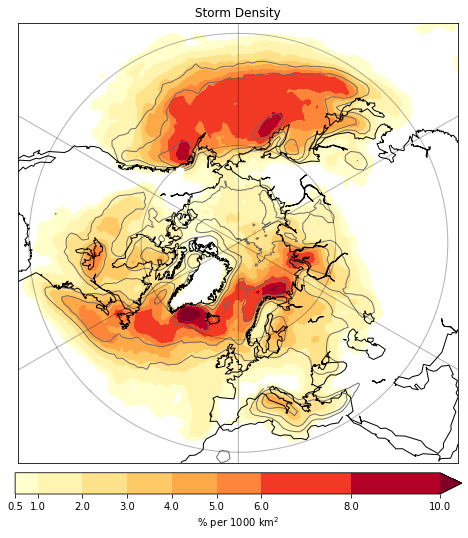

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


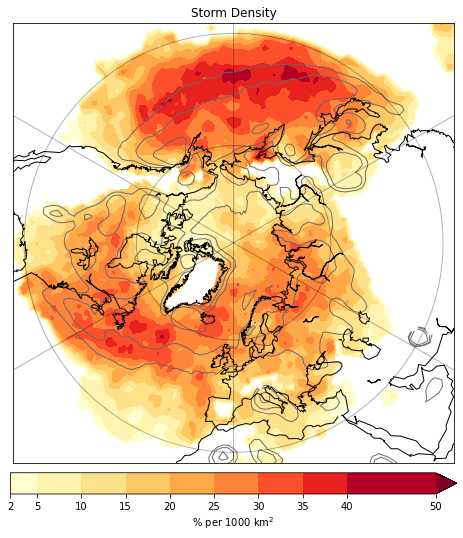

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


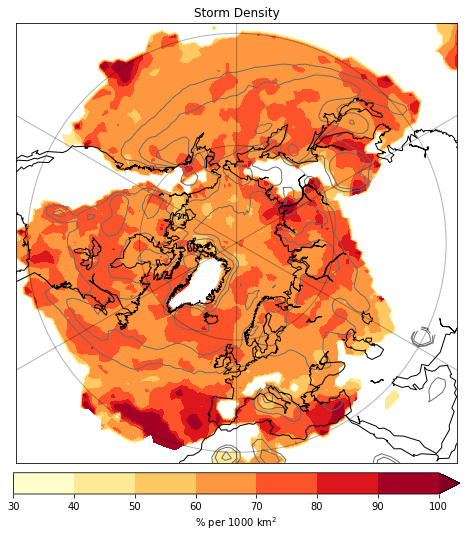

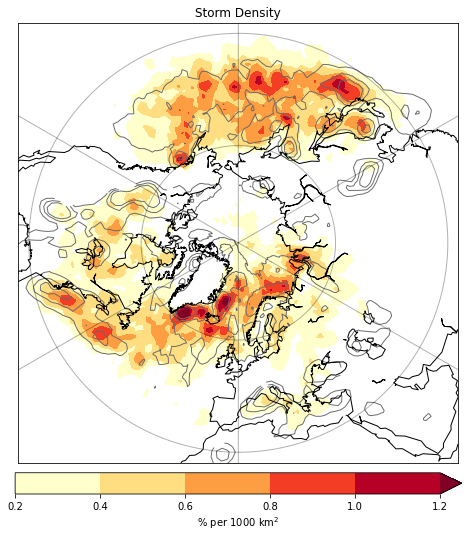

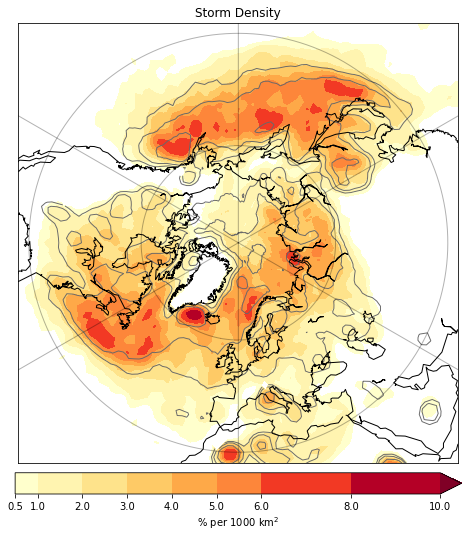

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


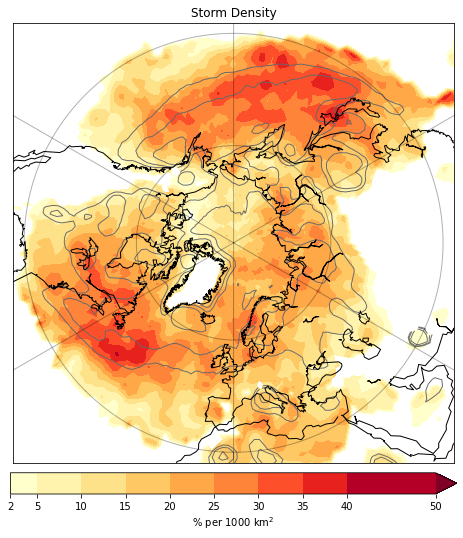

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


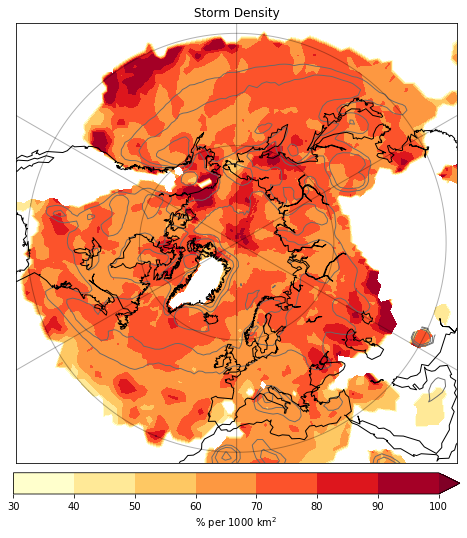

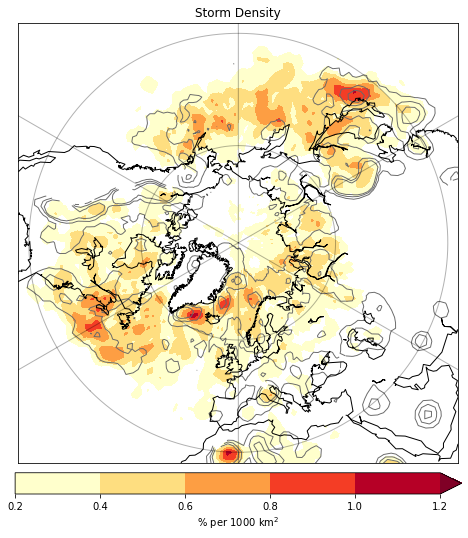

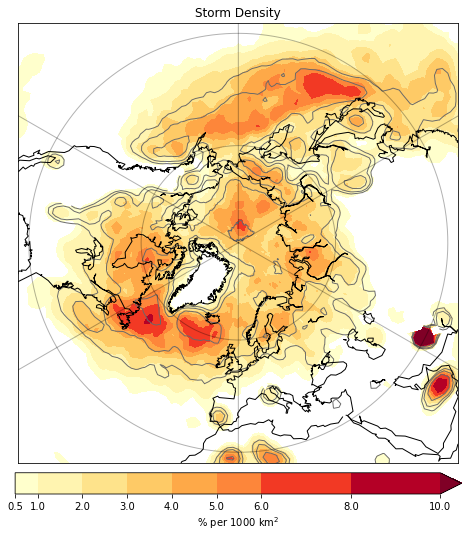

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


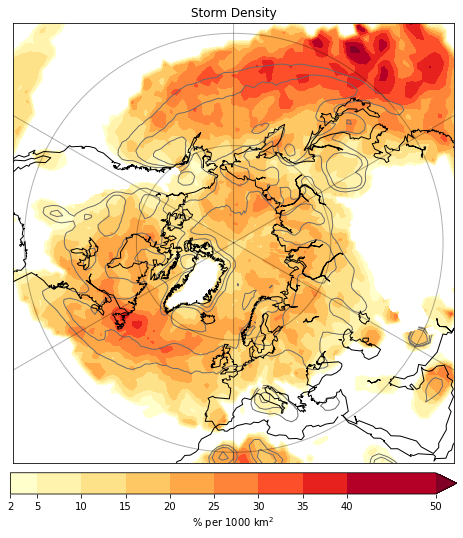

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


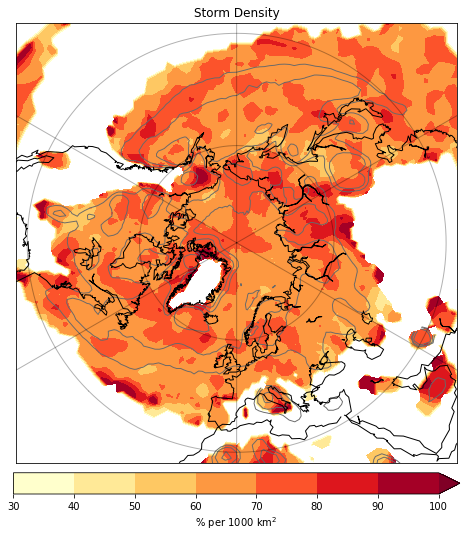

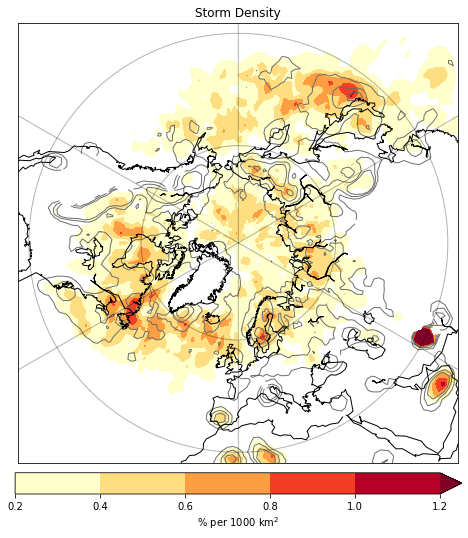

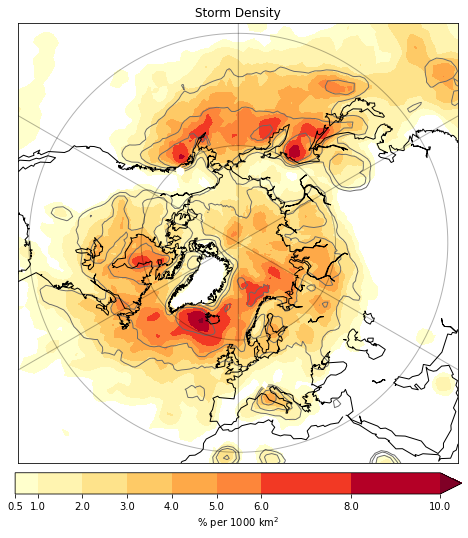

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


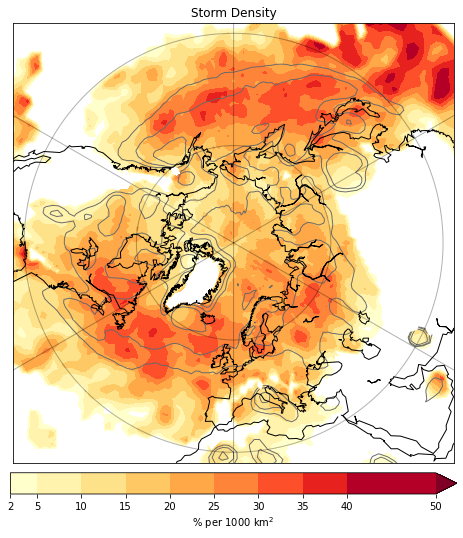

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


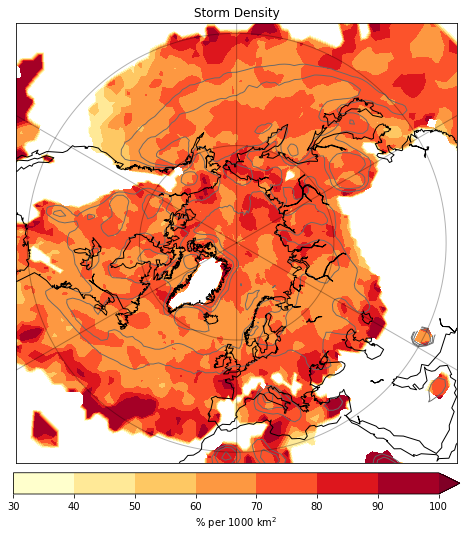

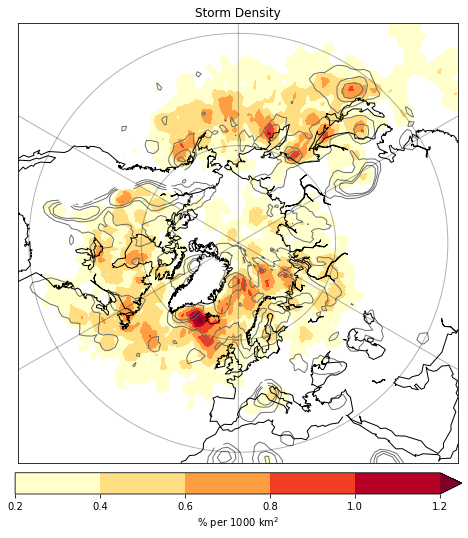

In [15]:
###### CLUSTERS LENGTH ##############
clustchar = "length"


clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0
genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

frac_scale = [2.0,5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,50.0]
frac_scale_clust = [30.0,40.0,50.0,60.0,70.0,80.0,90.0,100.0]

for s in range(len(seasons)):
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_clst_ei_length[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei_length[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize)  
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas_clust = mean_storms_seas_clst_ei_length[s,::,::]/(mean_storms_seas_clst_ei_nolength[s,::,::] + mean_storms_seas_clst_ei_length[s,::,::])*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)
    #perc_storms_seas_clust = mean_storms_seas_clst_ei_length[s,::,::]/mean_storms_seas_clst_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas_clust,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale_clust, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/FractionalClust_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei_length[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


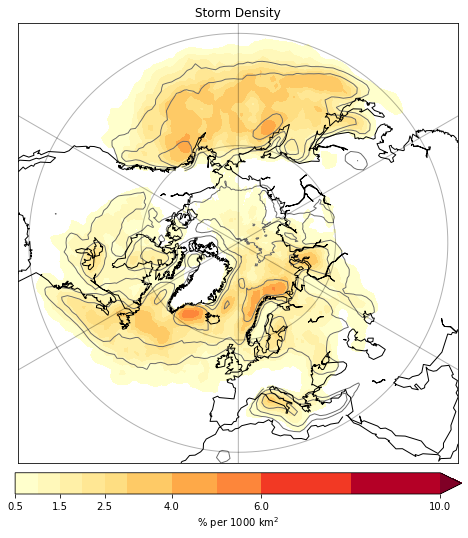

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


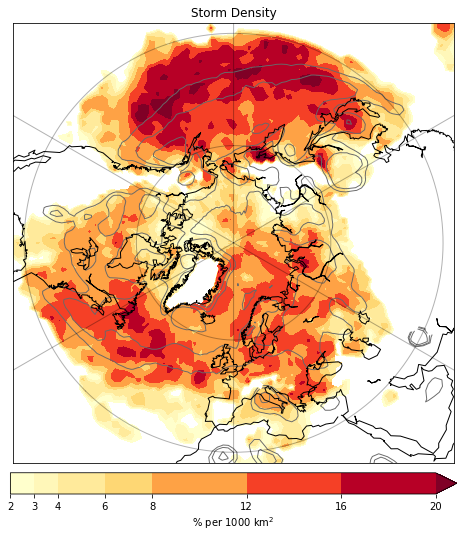

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


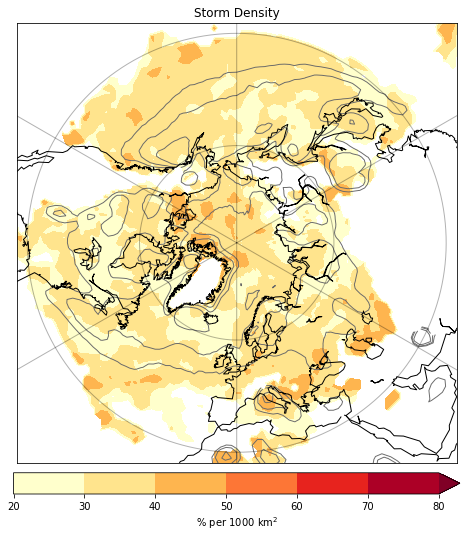

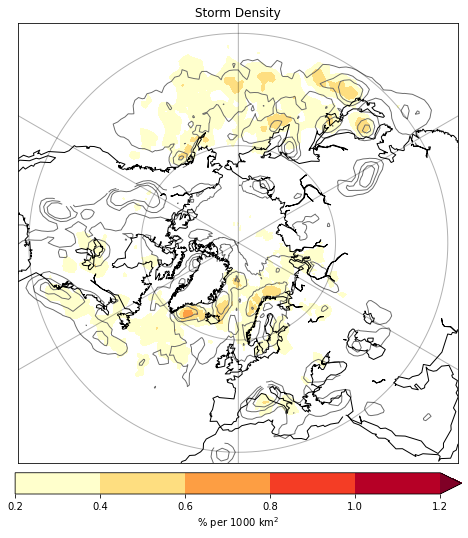

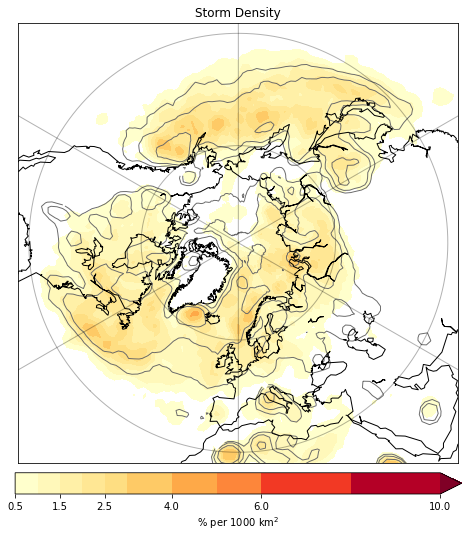

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


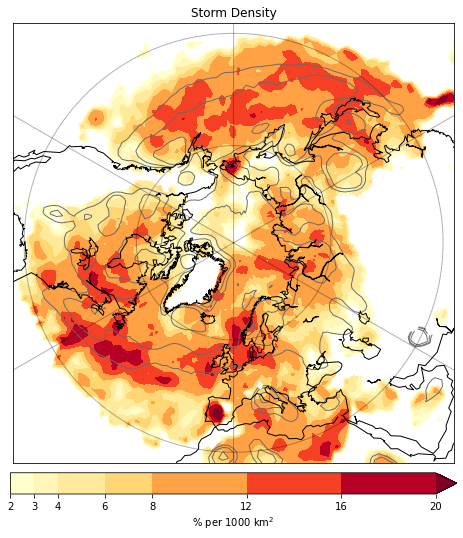

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


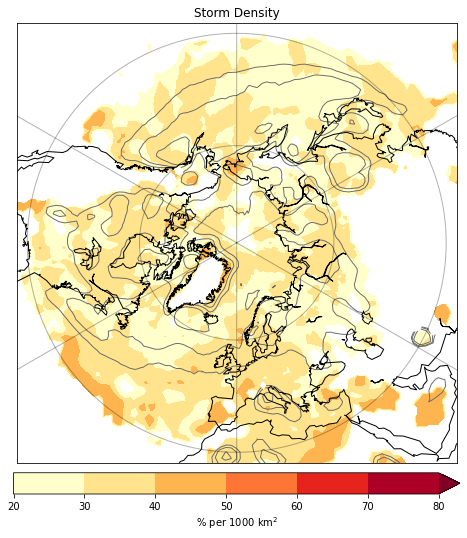

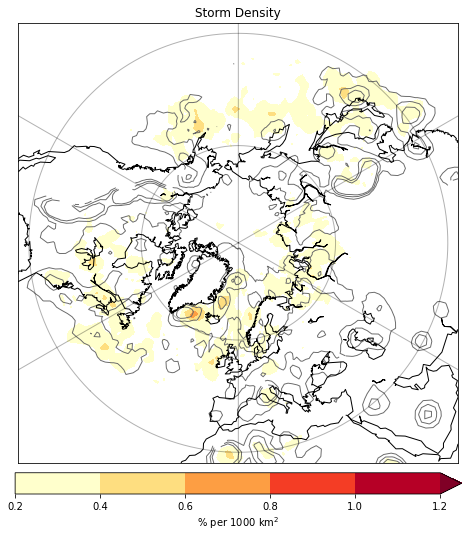

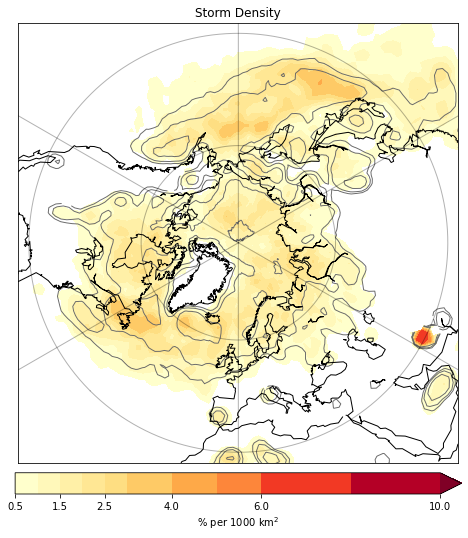

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


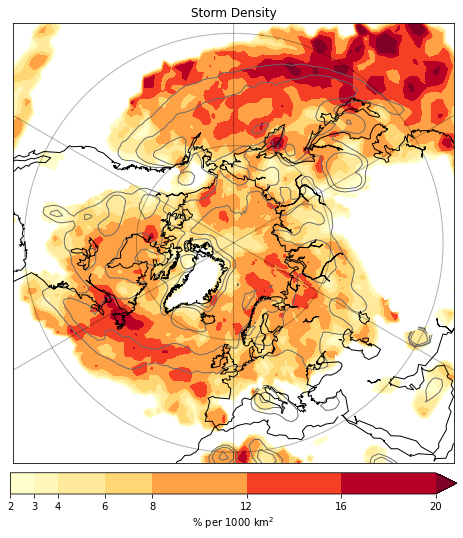

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


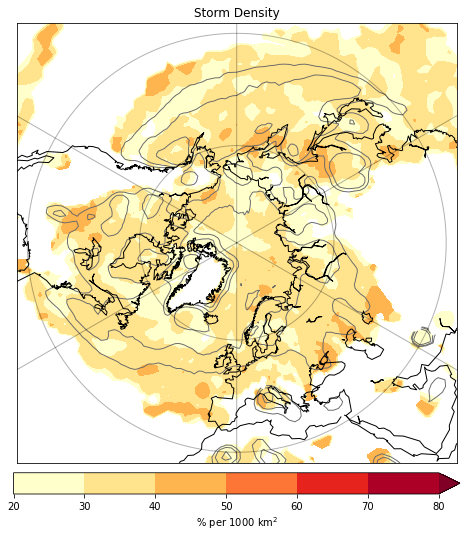

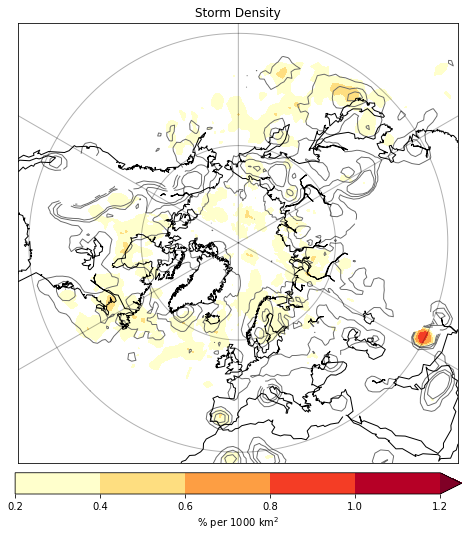

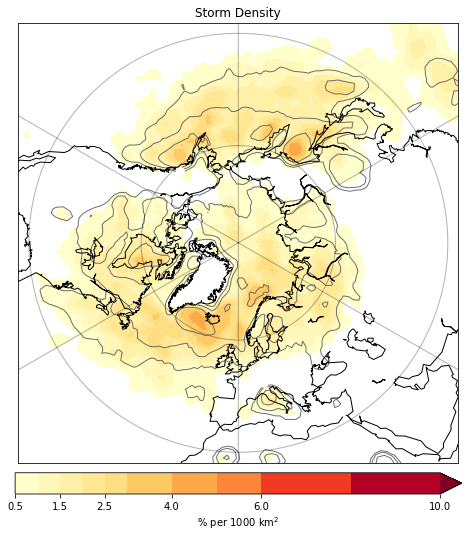

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


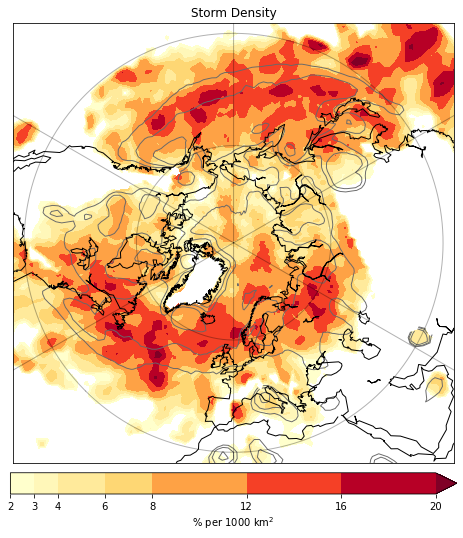

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


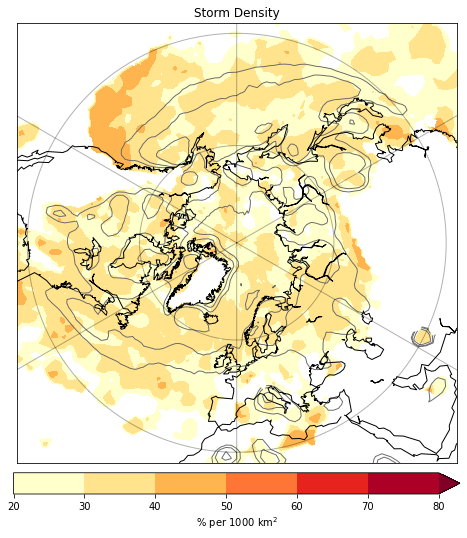

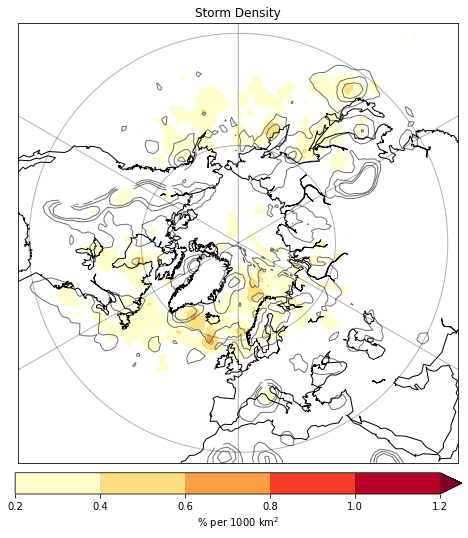

In [82]:
###### CLUSTERS LENGTH ##############
clustchar = "nolength"

frac_scale = [2.0,3.0,4.0,6.0,8.0,12.0,16.0,20.0]
clust_scale = [0,0.5,1.0,1.5,2.0,2.5,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0
genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

frac_scale_clust = [20.0,30.0,40.0,50.0,60.0,70.0,80.0]

for s in range(len(seasons)):
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_clst_ei_nolength[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei_nolength[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize)  
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas_clust = mean_storms_seas_clst_ei_nolength[s,::,::]/(mean_storms_seas_clst_ei_nolength[s,::,::] + mean_storms_seas_clst_ei_length[s,::,::])*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas_clust,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale_clust, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/FractionalClust_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei_nolength[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


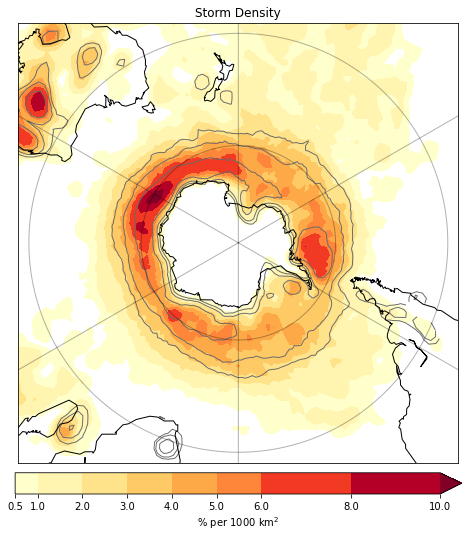

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


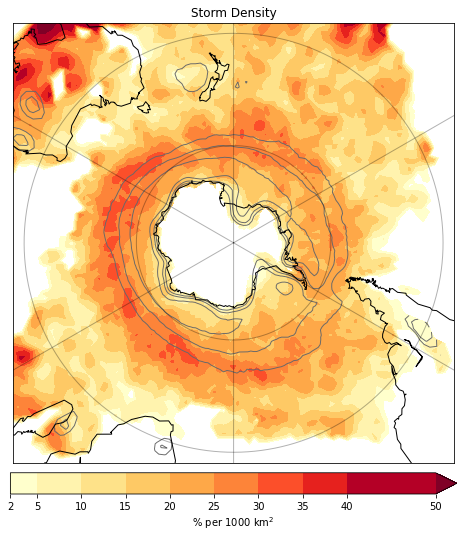

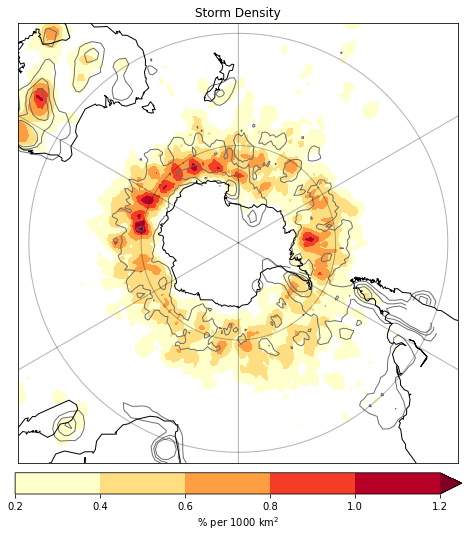

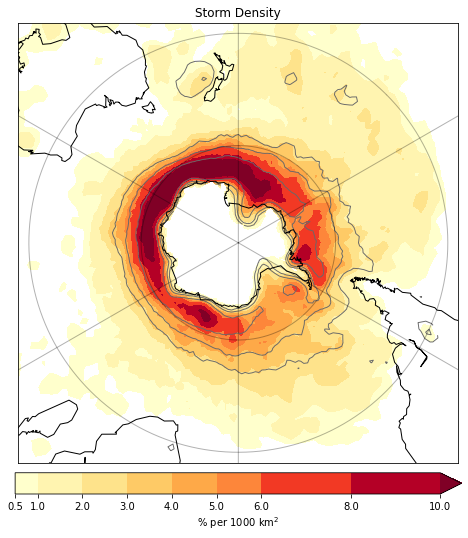

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


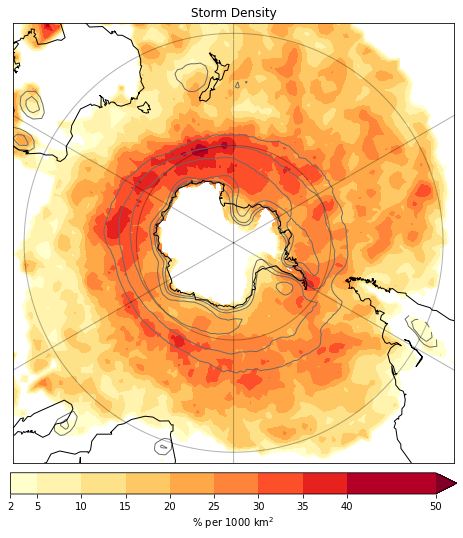

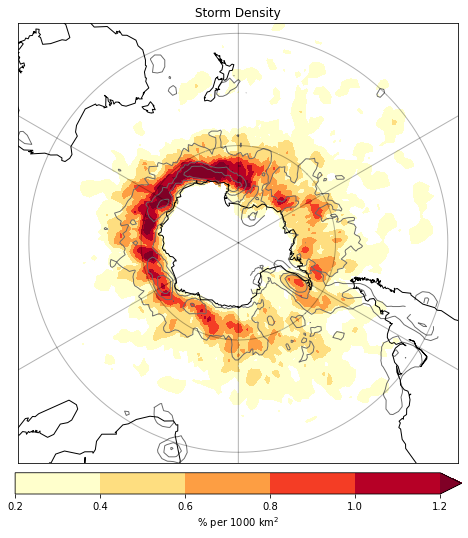

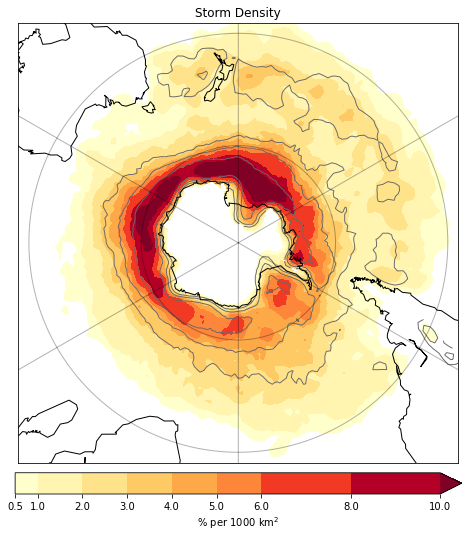

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


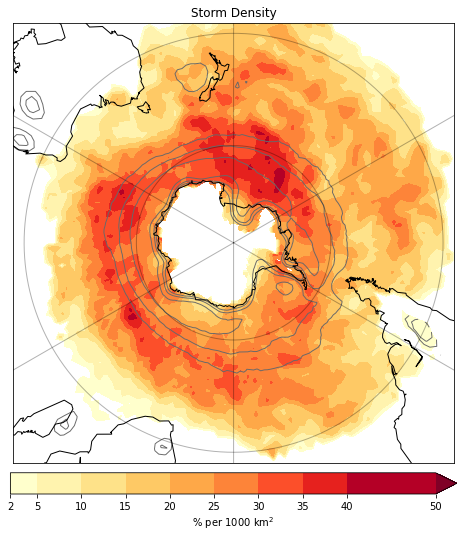

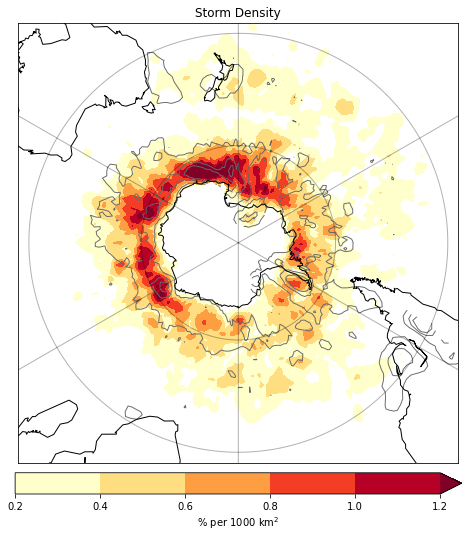

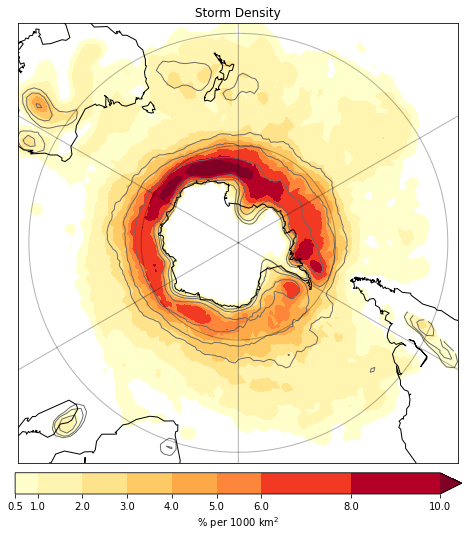

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


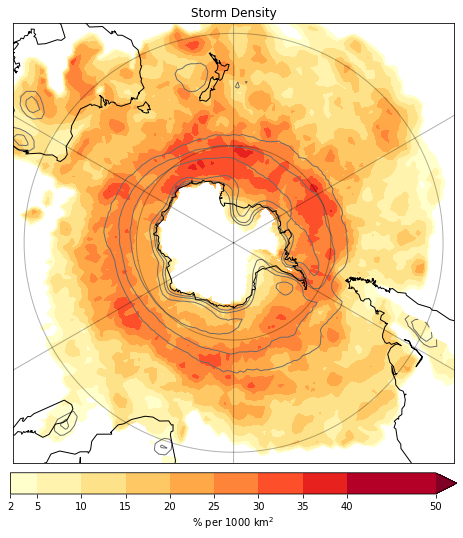

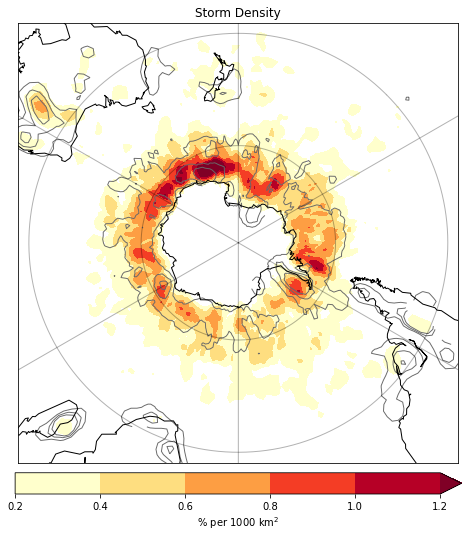

In [21]:
###### CLUSTERS LENGTH ##############
clustchar = "length"


clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0
genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

frac_scale = [2.0,5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,50.0]
frac_scale_clust = [30.0,40.0,50.0,60.0,70.0,80.0,90.0,100.0]

for s in range(len(seasons)):
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_clst_ei_length[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei_length[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize)  
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
   
    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei_length[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


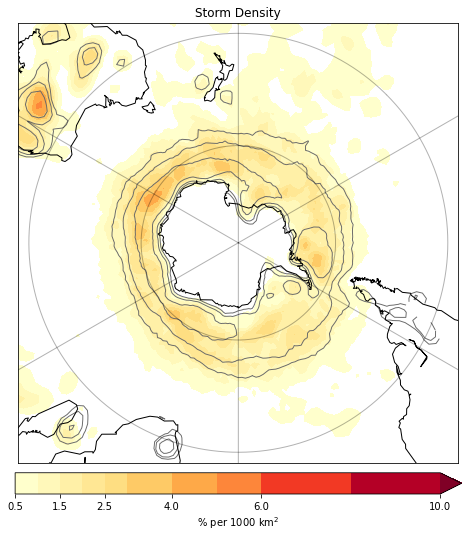

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


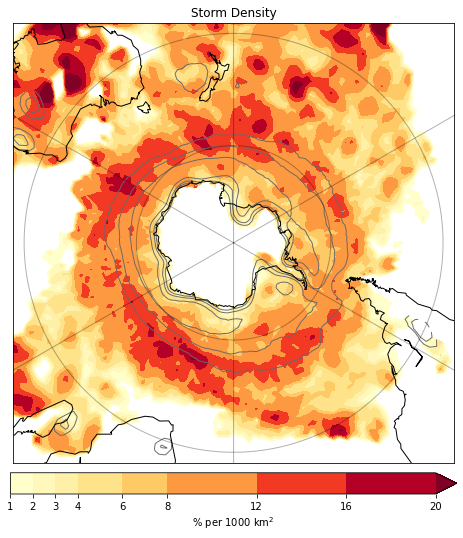

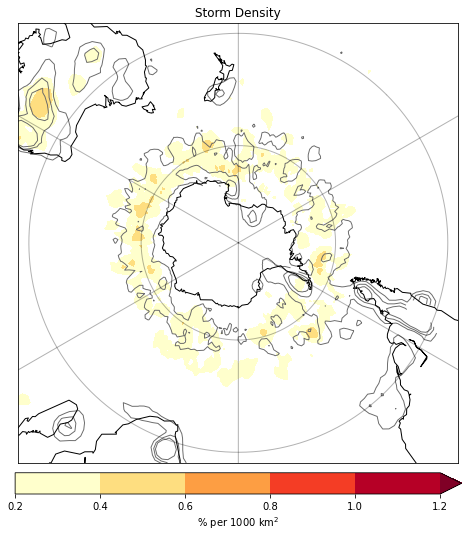

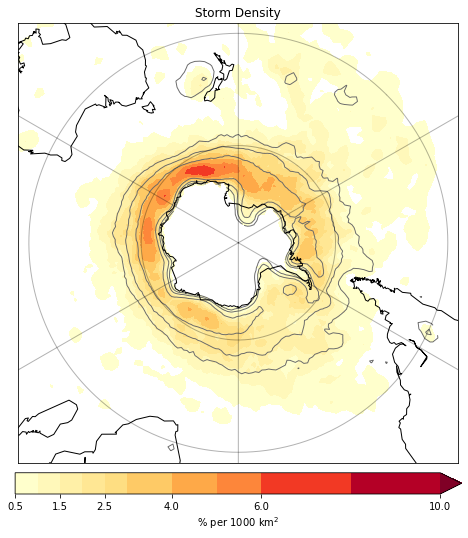

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


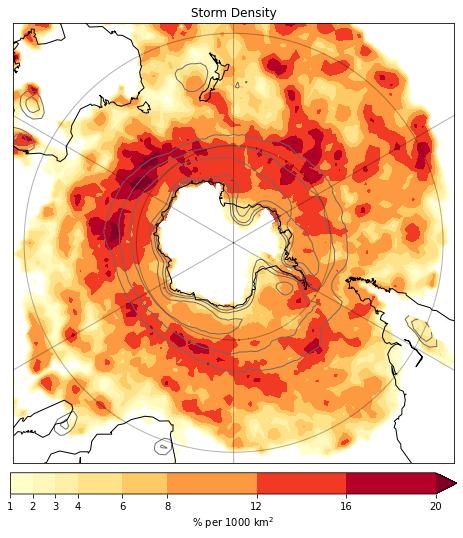

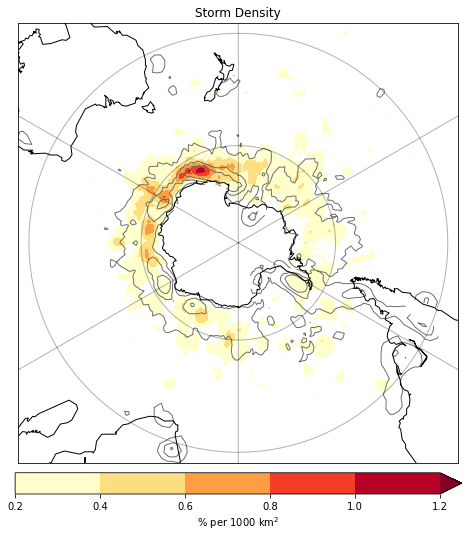

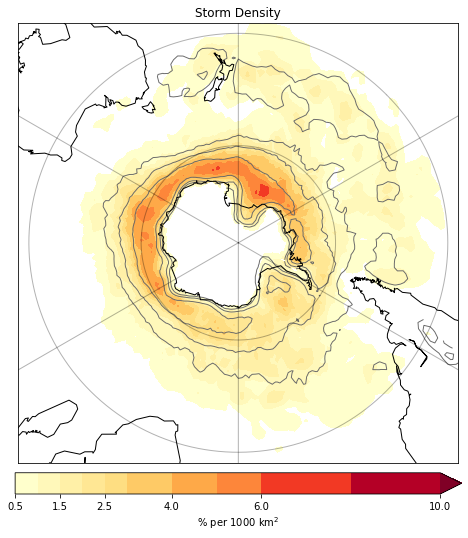

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


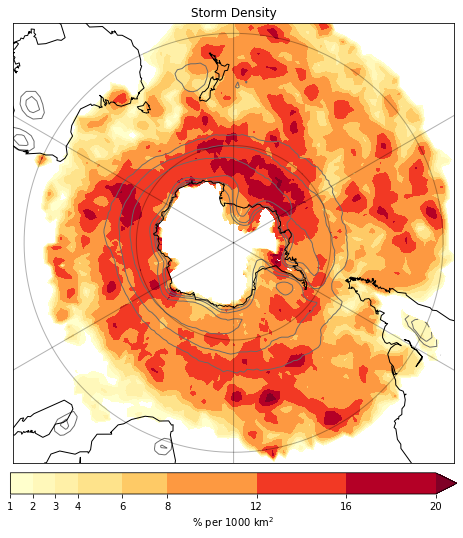

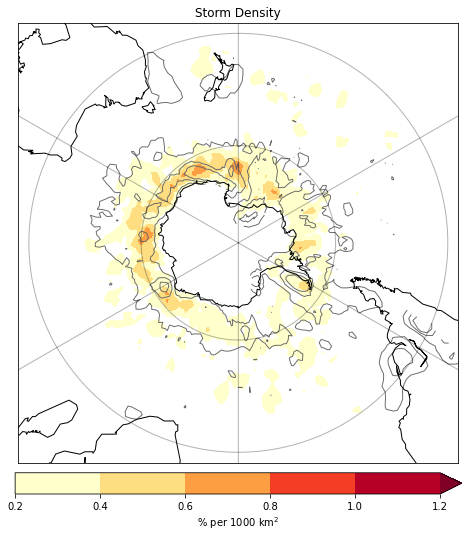

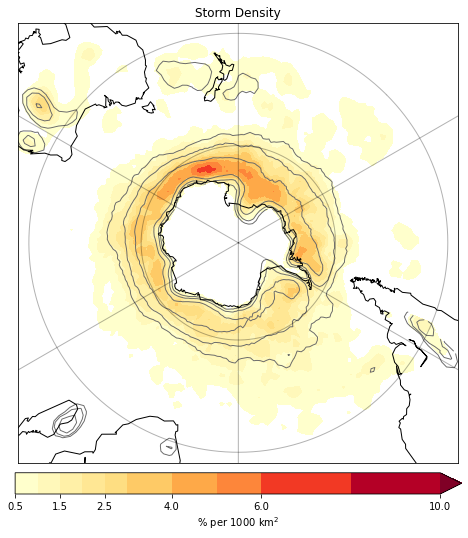

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


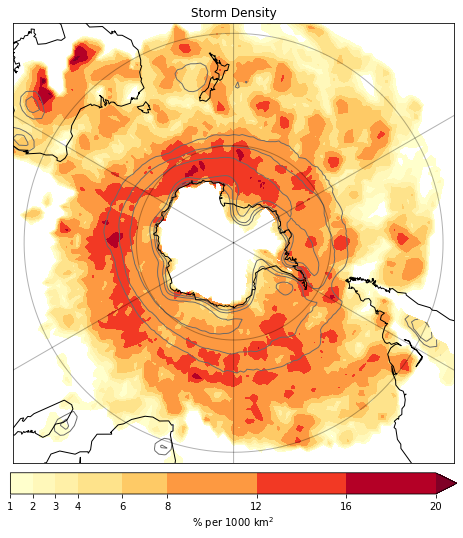

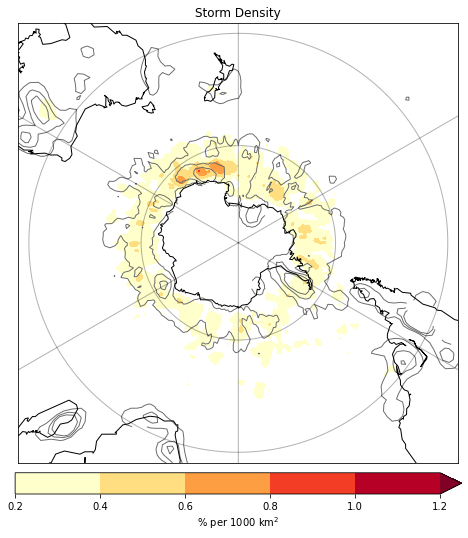

In [22]:
###### CLUSTERS LENGTH ##############
clustchar = "nolength"

frac_scale = [1.0,2.0,3.0,4.0,6.0,8.0,12.0,16.0,20.0]
clust_scale = [0,0.5,1.0,1.5,2.0,2.5,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0
genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

frac_scale_clust = [30.0,40.0,50.0,60.0,70.0,80.0,90.0,100.0]

for s in range(len(seasons)):
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_clst_ei_nolength[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei_nolength[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize)  
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei_nolength[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


In [63]:
mean_storms_seas_clst_ei_length[s,::,::]/mean_storms_seas_clst_ei[s,::,::]*100

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


array([[78.78787879, 78.78787879, 78.78787879, ..., 78.78787879,
        78.78787879, 78.78787879],
       [82.92682927, 82.71604938, 81.70731707, ..., 85.        ,
        83.95061728, 82.92682927],
       [91.46341463, 89.28571429, 89.41176471, ..., 91.25      ,
        91.13924051, 91.35802469],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])

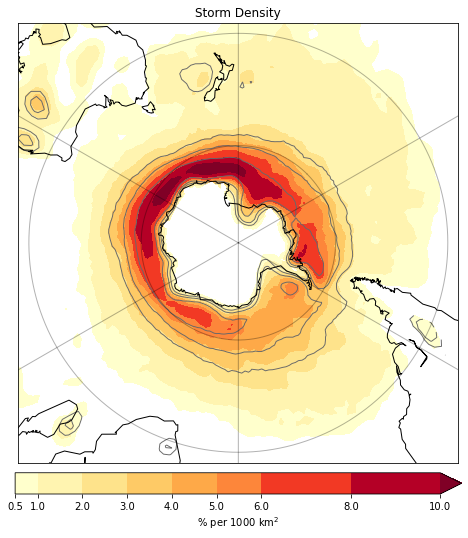

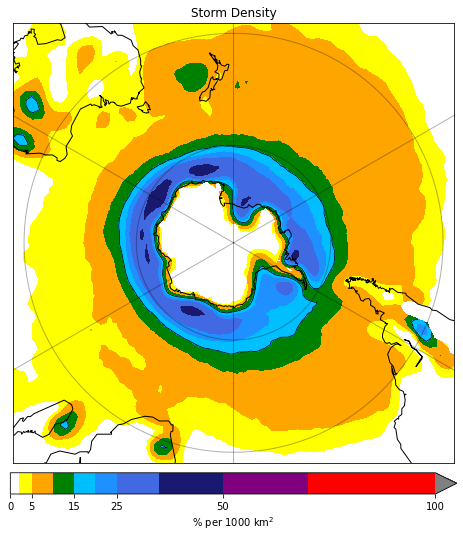

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


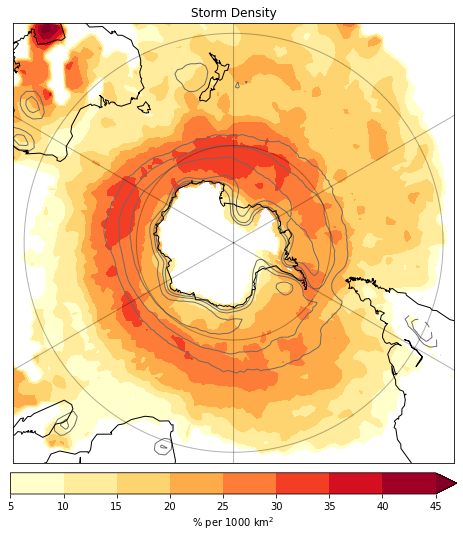

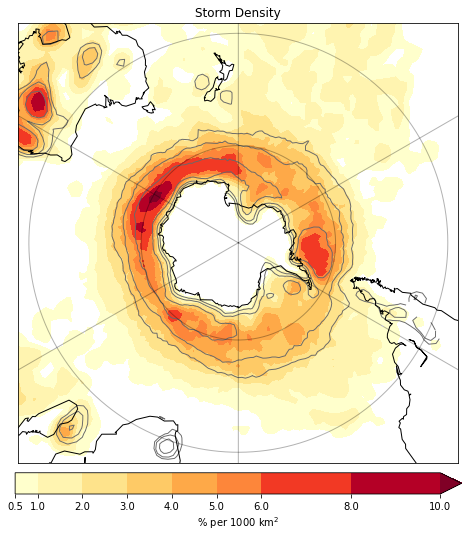

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide


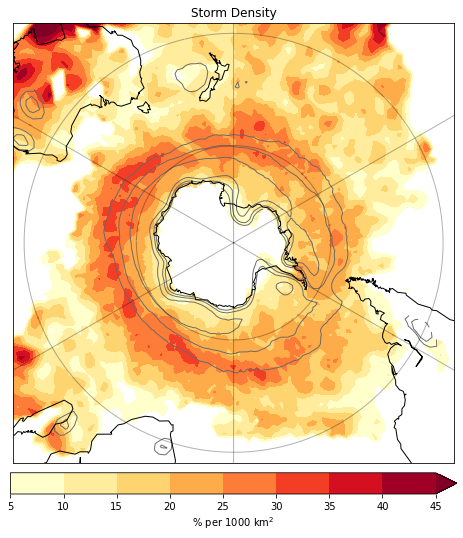

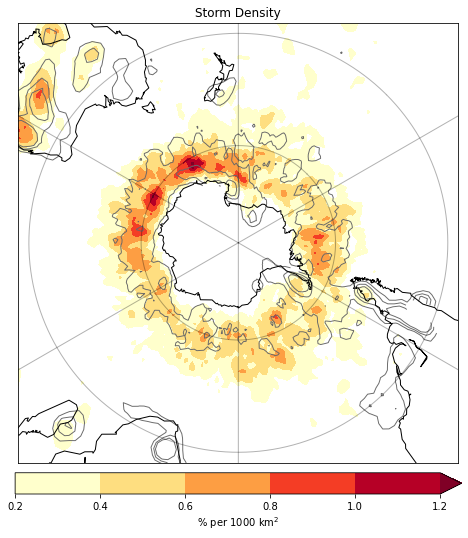

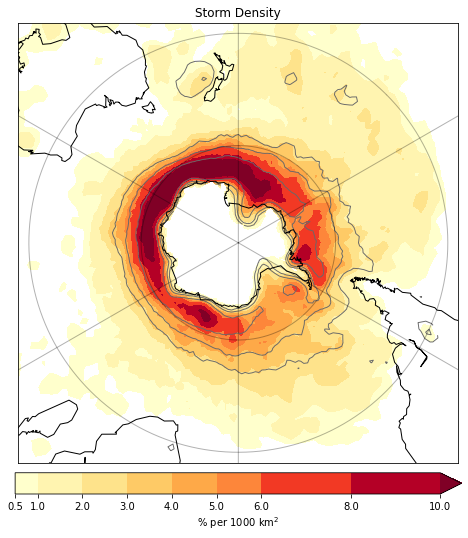

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide


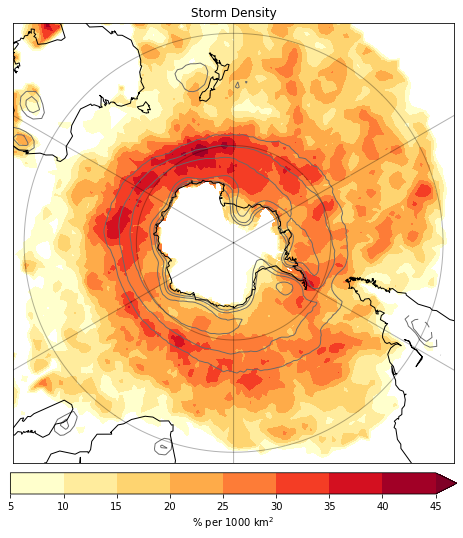

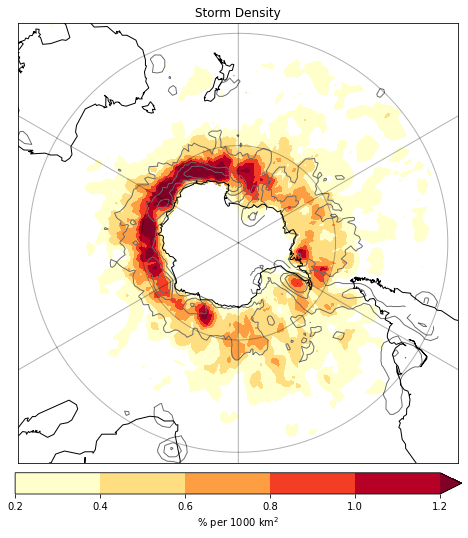

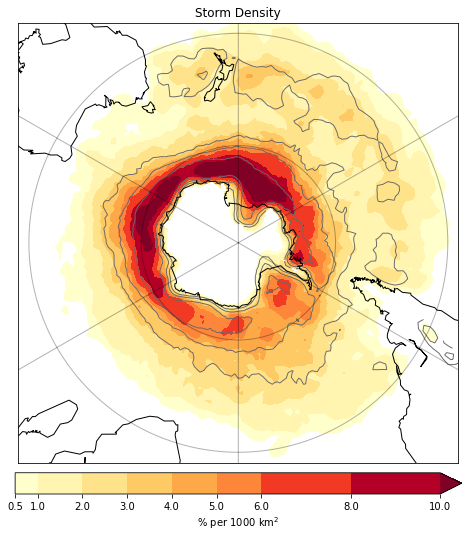

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide


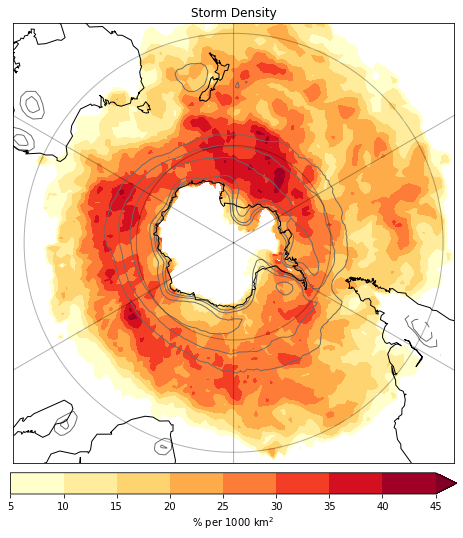

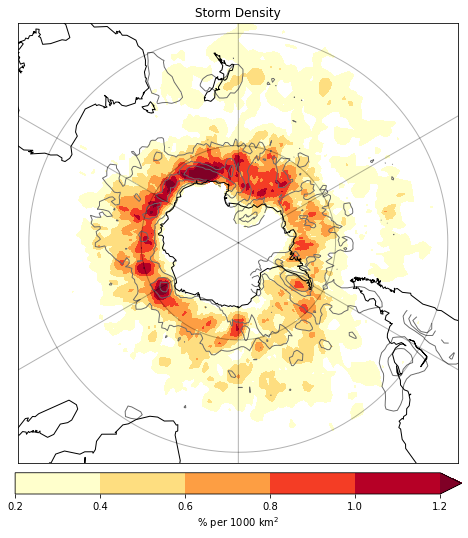

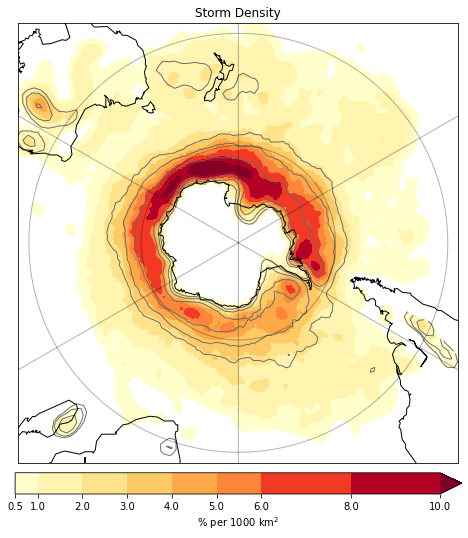

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide


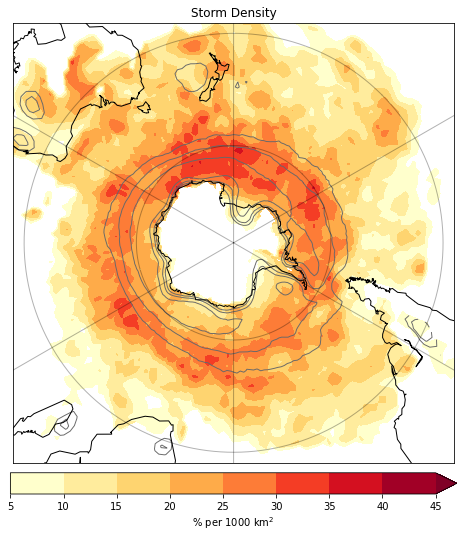

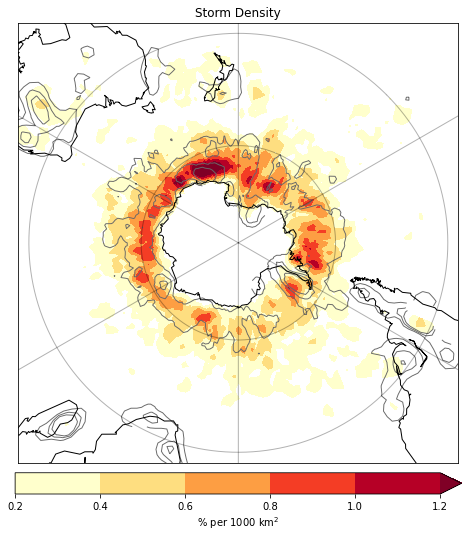

In [20]:
##### SOUTHERN HEMISPHERE
clustchar = "All"
%matplotlib inline

clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0

genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

normal_scale = [1.0,2.0,4.0,6.0,9.0,12.0,16.0,20.0,25.0,30.0,40.0,50.0] #16.0,20.0,25.0,30.0
imilast_scale = [0.0,2.0,5.0,10.0,15.0,20.0,25.0,35.0,50.0,70.0,100.0]

frac_scale = [5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,45.0]

seasons = ["DJF","MAM","JJA","SON"]

'''
plt.figure() 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', scale=[15], linewidths=0.75)] 
fig.map(mean_storms_clst_ei[::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density",colors=colors_IMILAST, scale=clust_scale, cmap=None, #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")

'''

plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')] 
fig.map(mean_storms_clst_ei[::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', scale=[15], linewidths=0.75)] 
fig.map(mean_storms_ei[::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density",cmap=None,colors=colors_IMILAST, scale=imilast_scale, #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


perc_storms = mean_storms_clst_ei[::,::]/mean_storms_ei[::,::]*100*(mean_storms_ei[::,::]*100.0 > 2.0)
plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')] 
fig.map(perc_storms,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Frac_Density_ERA5_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")

#,colors=colors_IMILAST,

for s in range(len(seasons)):
    plt.figure(figsize=figsize)
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_clst_ei[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
    perc_storms_seas = mean_storms_seas_clst_ei[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_clst_ei[s,::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Clust_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


In [40]:
str_connected[ids_storms[uniq_ids[1]]][str_conn >= 1]

NameError: name 'ids_storms' is not defined

In [41]:
lengths = [len(x) for x in sorted_clusters]

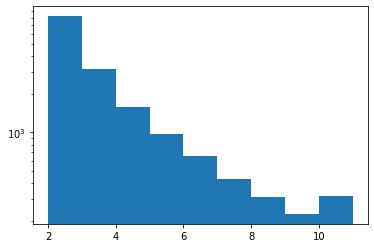

In [42]:
%matplotlib inline
plt.figure()
plt.hist(lengths,np.arange(2,12),log=True,stacked=True)
plt.show()

In [42]:
dtTracks = Results["dtTracks"]
drTracks = Results["drTracks"]

In [24]:
from scipy.sparse import dok_matrix
test =  dok_matrix((np.nanmax(137070),np.nanmax(137070)))
test[232,231] = 1.0
test[4411,12] = 2.0

from scipy.sparse import save_npz
save_npz("testing.npz",test.tocoo())

In [59]:
test2 = test.tocoo()

In [62]:
np.savez("test.npz",test2=test2)

In [26]:
ResultsTest = np.load("testing.npz",allow_pickle=True)

In [29]:
ResultsTest[]

In [14]:
test3

array(<137070x137070 sparse matrix of type '<class 'numpy.float64'>'
	with 2 stored elements in COOrdinate format>, dtype=object)

In [31]:
from scipy.sparse import load_npz

In [32]:
ResultsTest = load_npz("testing.npz")

In [34]:
ResultsTest

<137070x137070 sparse matrix of type '<class 'numpy.float64'>'
	with 2 stored elements in COOrdinate format>

In [3]:
#Construct array with datetimes
from datetime import datetime as dt, timedelta as td
import numpy as np
dt_array = []
for yidx in range(1979,2019):

    # To get year (integer input) from the user
    # year = int(input("Enter a year: "))
    if ((yidx + 1) % 4) == 0:
        leapyear = True
        nr_times = 366*4 #(whole year) 364 (just winter)
    else:
        leapyear = False
        nr_times = 365*4 #(whole year) 360 (just winter)

    start = dt(yidx, 1, 1, 0) #dt(yidx, 12, 1, 0) (just winter)

    dt_array_temp = np.array([start + td(hours=i*6) for i in range(nr_times)])
    dt_array.extend(dt_array_temp)


In [8]:
lats = np.arange(90,-90.1,-1.5)
lons = np.arange(0,360,1.5)
storms = np.zeros((5844,len(lats),len(lons))) #Cyclone centre density


In [4]:
#Construct array with datetimes
dt_array = []
for yidx in range(1979,2019):

    # To get year (integer input) from the user
    # year = int(input("Enter a year: "))
    if ((yidx + 1) % 4) == 0:
        leapyear = True
        nr_times = 366*4 #(whole year) 364 (just winter)
    else:
        leapyear = False
        nr_times = 365*4 #(whole year) 360 (just winter)

    start = dt(yidx, 1, 1, 0) #dt(yidx, 12, 1, 0) (just winter)

    dt_array_temp = np.array([start + td(hours=i*6) for i in range(nr_times)])
    dt_array.extend(dt_array_temp)
    
    
months = np.array([x.month for x in dt_array])

In [1]:
months.shape
(months < 6) | (months >= 3)
print(np.nansum((months < 6) & (months >= 3)))
print(np.nansum((months < 12) & (months >= 9)))

NameError: name 'months' is not defined

In [21]:
#Filter clusterd storms
minstorms = 3
strmidxs = np.unique(str_id)
clststroms = [strm for cluster in sorted_clusters for strm in cluster if len(cluster) >= minstorms and strm in strmidxs]
clststroms = sorted(clststroms)

In [22]:
sorted_clusters[0:8]

array([list([1, 2]), list([3, 42]), list([4, 26, 28, 31, 33, 38, 48]),
       list([5, 23, 24]), list([6]), list([7, 20]), list([8]), list([9])],
      dtype=object)

In [23]:
clststroms

[4,
 5,
 14,
 17,
 18,
 19,
 23,
 24,
 26,
 28,
 31,
 33,
 36,
 37,
 38,
 39,
 41,
 47,
 48,
 50,
 51,
 52,
 55,
 60,
 61,
 62,
 65,
 67,
 70,
 71,
 73,
 78,
 86,
 87,
 89,
 90,
 95,
 96,
 99,
 102,
 103,
 104,
 105,
 108,
 109,
 112,
 113,
 115,
 117,
 123,
 126,
 130,
 131,
 133,
 137,
 144,
 146,
 147,
 150,
 154,
 157,
 158,
 163,
 167,
 170,
 171,
 190,
 191,
 192,
 194,
 200,
 202,
 209,
 210,
 213,
 216,
 217,
 218,
 231,
 232,
 233,
 235,
 236,
 237,
 238,
 240,
 241,
 243,
 244,
 246,
 248,
 249,
 250,
 251,
 256,
 257,
 258,
 259,
 260,
 262,
 266,
 268,
 270,
 274,
 275,
 278,
 280,
 283,
 289,
 290,
 292,
 295,
 299,
 300,
 302,
 304,
 308,
 316,
 323,
 327,
 334,
 336,
 341,
 344,
 355,
 358,
 362,
 366,
 368,
 373,
 377,
 378,
 382,
 386,
 389,
 392,
 396,
 397,
 407,
 408,
 409,
 414,
 416,
 417,
 420,
 429,
 432,
 433,
 437,
 438,
 441,
 442,
 451,
 452,
 453,
 455,
 462,
 464,
 465,
 468,
 470,
 474,
 476,
 477,
 478,
 479,
 482,
 484,
 485,
 489,
 490,
 495,
 505,
 51

In [83]:
Options["timlngthresh"]*6.0

36.0

In [84]:
Options["outdir"] +  Options["str_result"] + formatter.format( Options["distthresh"]) + "_tim_" + formatter.format( Options["timthresh"]) + "_length_" + formatter.format( Options["lngthresh"]) + "_timlength_" + formatter.format( Options["timlngthresh"]*6.0)


'Clusters_output/Global_Results_EI_1.0_tim_36.0_length_1.0_timlength_36.0'

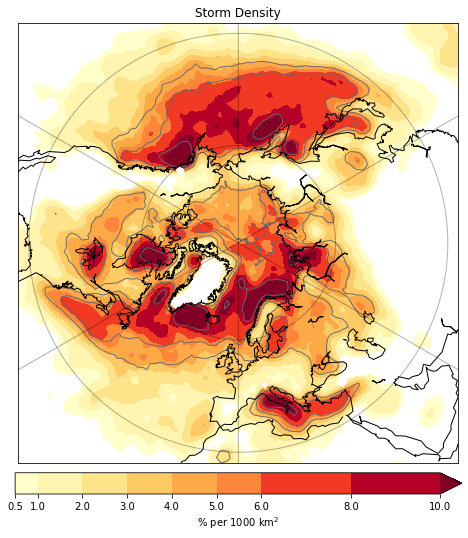

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


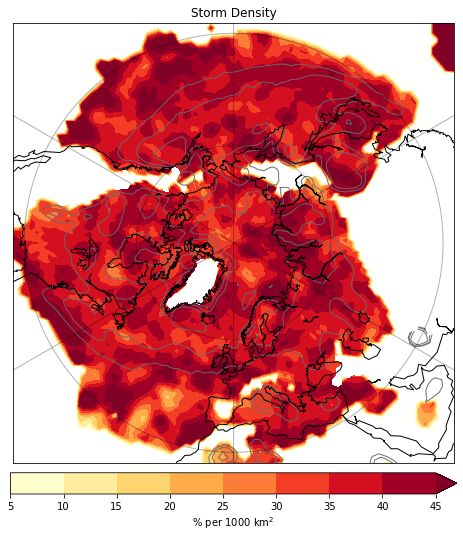

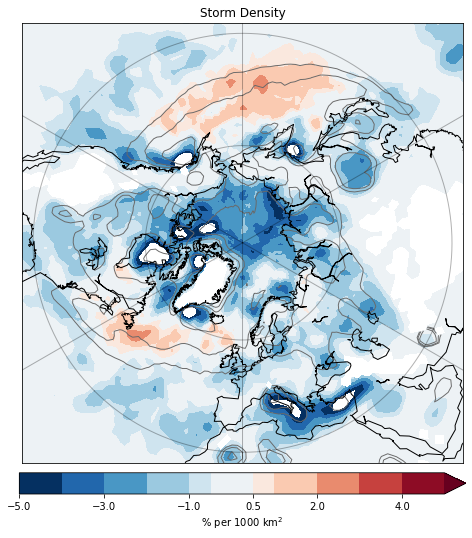

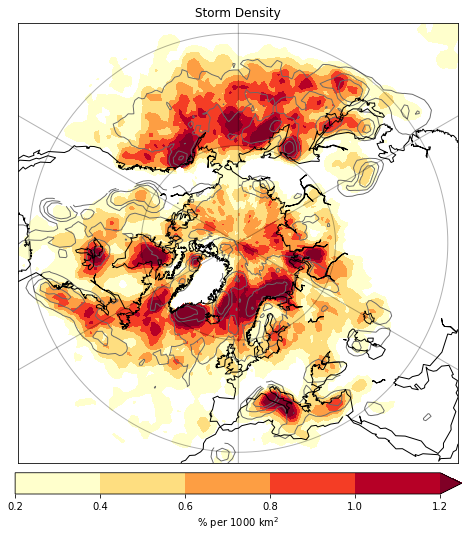

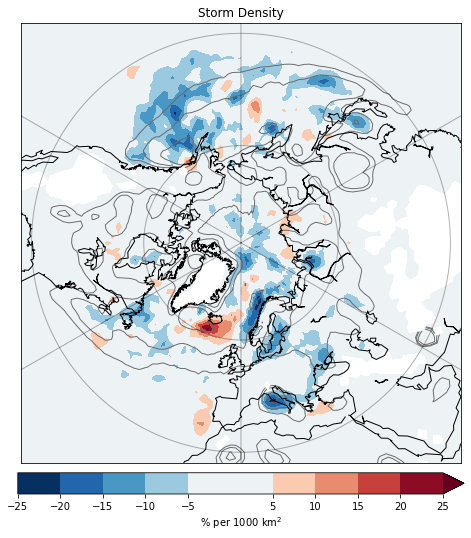

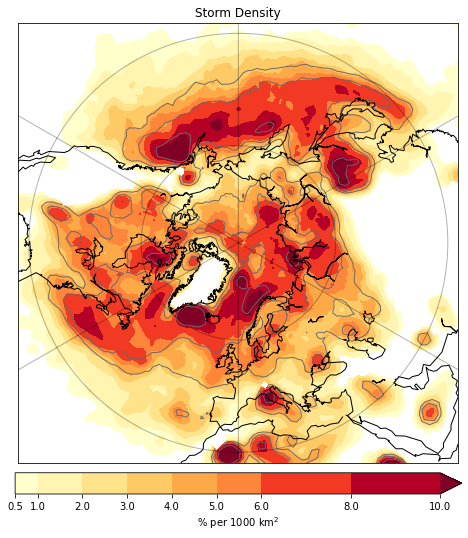

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


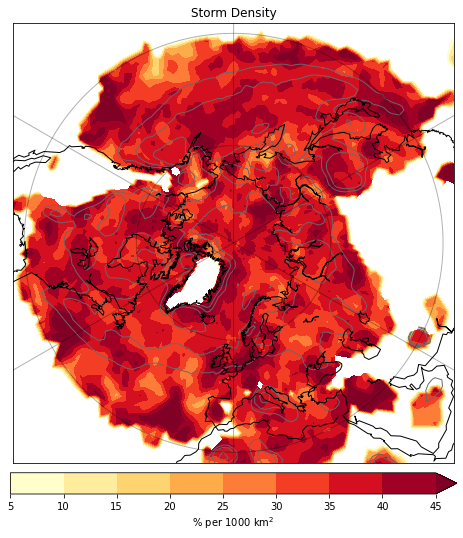

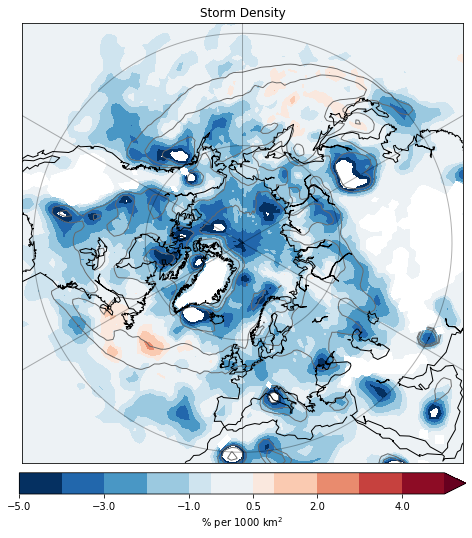

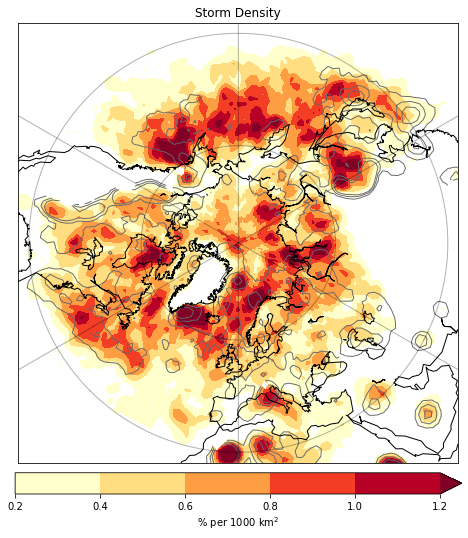

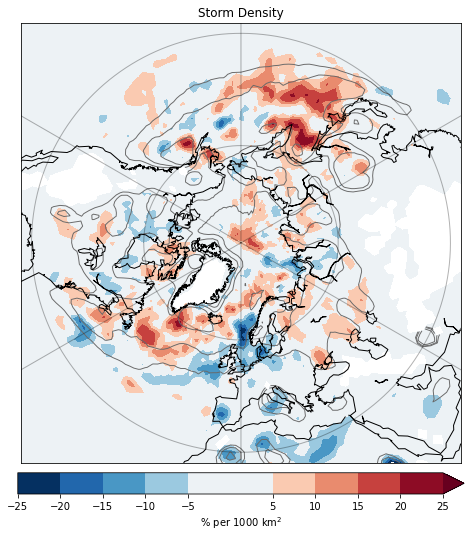

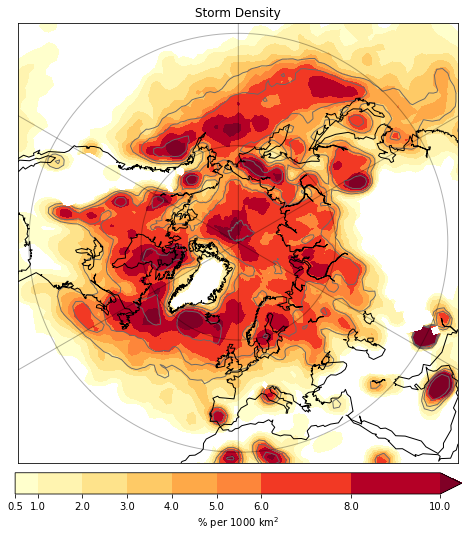

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


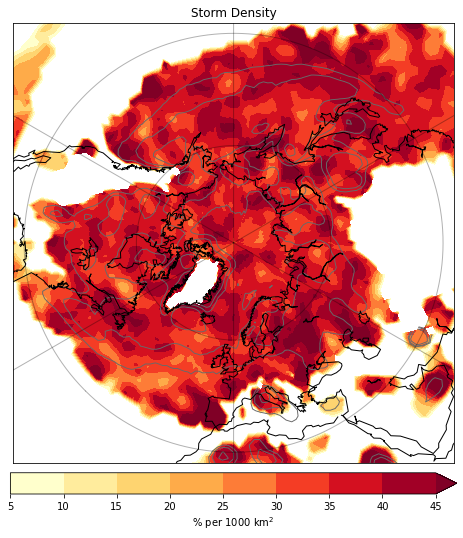

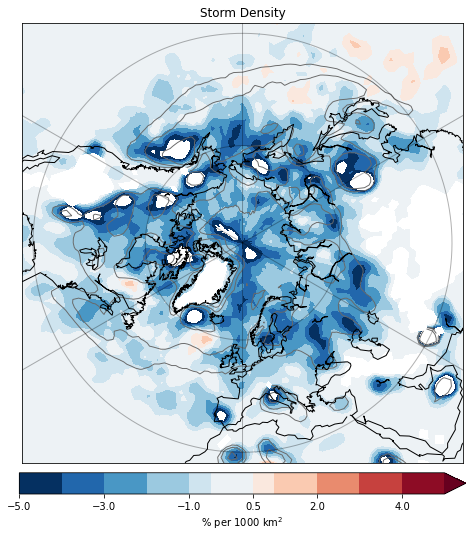

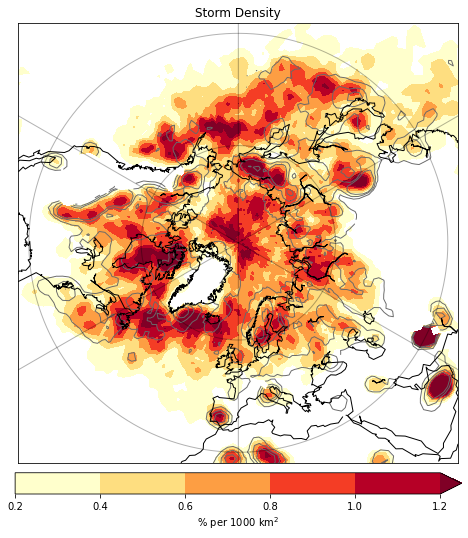

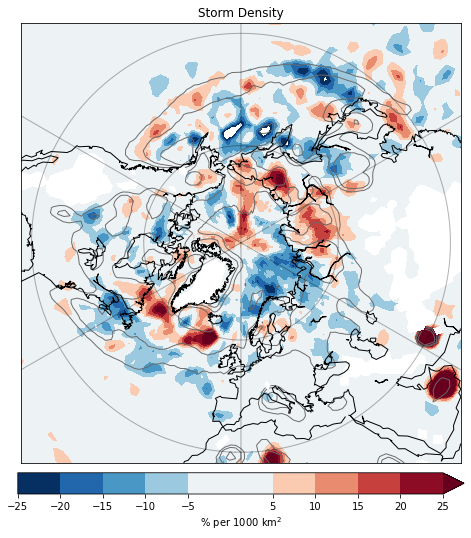

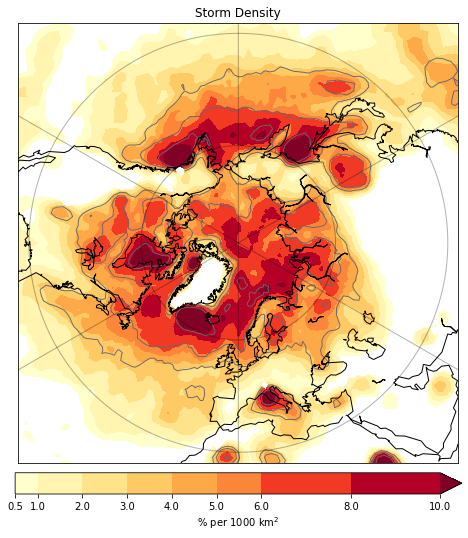

/home/WUR/weije043/virtual_envs/dynpie3_updated/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


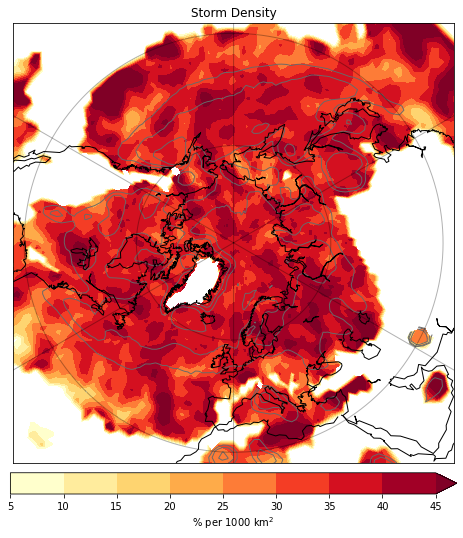

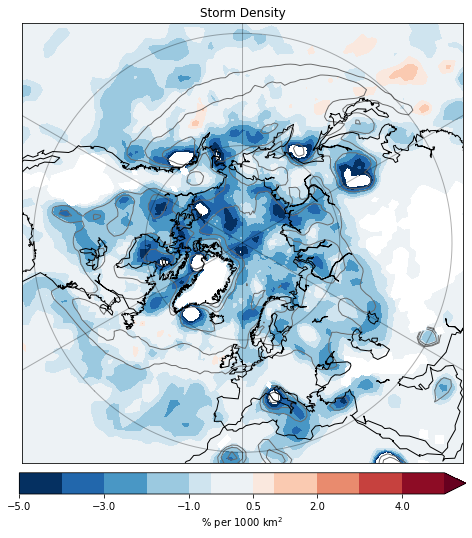

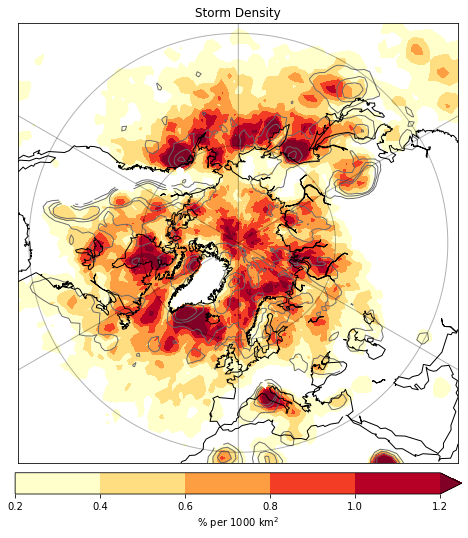

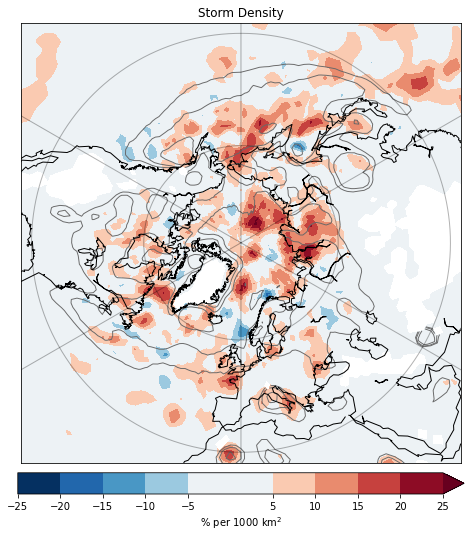

In [39]:
#Save density

minstorms = 2
######################################################
# load clustering results
######################################################
formatter =  "{:1.1f}"
outfile="Density/Density__250km_Global_Results_EI_1.0_tim_36.0_length_1.0_Clust_All_minstorms_2_solo.npz"

ResultsDensitySolo = np.load(outfile)
mean_storms_solo_ei = ResultsDensitySolo["mean_storms"]
mean_tracks_solo_ei = ResultsDensitySolo["mean_tracks"]
mean_storms_seas_solo_ei = ResultsDensitySolo["mean_storms_seas"]
mean_genesis_seas_solo_ei = ResultsDensitySolo["mean_genesis_seas"]

seasons = ["DJF","MAM","JJA","SON"]

%matplotlib inline

clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0
diff_scale = [-5.0,-4.0,-3.0,-2.0,-1.0,-0.5,0.5,1.0,2.0,3.0,4.0,5.0] #16.0,20.0,25.0,30.0
diff_scale_clust = [-25.0,-20.0,-15.0,-10.0,-5.0,5.0,10.0,15.0,20.0,25.0]

genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

normal_scale = [1.0,2.0,4.0,6.0,9.0,12.0,16.0,20.0,25.0,30.0,40.0,50.0] #16.0,20.0,25.0,30.0
imilast_scale = [0.0,2.0,5.0,10.0,15.0,20.0,25.0,35.0,50.0,70.0,100.0]

frac_scale = [5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,45.0]

for s in range(len(seasons)):
    plt.figure(figsize=figsize)
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_storms_seas_solo_ei[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Density_ERA5_Solo_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    perc_storms_seas = mean_storms_seas_solo_ei[s,::,::]/mean_storms_seas_ei[s,::,::]*100*(mean_storms_seas_ei[s,::,::]*100.0 > 2.5)

    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(perc_storms_seas,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=frac_scale, cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Fractional_Density_ERA5_Solo_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    diff_storms_seas = mean_storms_seas_clst_ei[s,::,::] - mean_storms_seas_solo_ei[s,::,::]
    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(diff_storms_seas*100.0,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=diff_scale, cmap="RdBu_r", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Difference_Density_ERA5_Clust-Solo_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()
    
    overlays = [fig.map_overlay_contour(mean_genesis_seas_ei[s,::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$',
                                        scale=[1,2,3], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(mean_genesis_seas_solo_ei[s,::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density", scale=genesis_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Mean_Genesis_ERA5_Solo_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")

    
    #Relative difference types
    diff_storms_seas_types = (mean_storms_seas_clst_ei_length[s,::,::]/np.nanmax(mean_storms_seas_clst_ei_length[s,10:35,::]) - 
                              mean_storms_seas_clst_ei_nolength[s,::,::]/np.nanmax(mean_storms_seas_clst_ei_nolength[s,10:35,::]))*100
    
    plt.figure(figsize=figsize) 
    plt.tight_layout()    
    overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                        scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey')]  
    fig.map(diff_storms_seas_types,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
    title="Storm Density",scale=diff_scale_clust, cmap="RdBu_r", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
    cb_label='% per 1000 km$^2$',extend="max",
    save="Plots/Final/Difference_Density_ERA5_Clust-NoLength_" + seasons[s] + "_" + formatter.format( Options["timthresh"]) + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")
    

In [22]:
mean_storms_seas_clst_ei_nolength.shape

(4, 121, 240)

In [38]:
grid.y[10:35,0]

array([75. , 73.5, 72. , 70.5, 69. , 67.5, 66. , 64.5, 63. , 61.5, 60. ,
       58.5, 57. , 55.5, 54. , 52.5, 51. , 49.5, 48. , 46.5, 45. , 43.5,
       42. , 40.5, 39. ], dtype=float32)

In [2]:
import math
import cartopy
import cartopy.crs as ccrs
map_proj = ccrs.LambertConformal(central_longitude=-10, central_latitude=39.0)

# Create the figure
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(1, 1, 1, projection=map_proj)
ax.set_extent([-100, 80, 20, 90], crs=ccrs.PlateCarree())

# Add all geographical features
ax.add_feature(cartopy.feature.OCEAN, zorder=0, facecolor='#E2F3FE')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='#DAEFC3')
ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.6)
ax.add_feature(cartopy.feature.BORDERS, linewidth=0.2)
ax.gridlines(color='k', linewidth=0.2)

# Add the subregions
ax.add_geometries([new_poly_GS], crs=ccrs.PlateCarree(), alpha=0.7, facecolor=GS_color, edgecolor='k', linewidth=2)
ax.add_geometries([new_poly_LS], crs=ccrs.PlateCarree(), alpha=0.7, facecolor=LS_color, edgecolor='k', linewidth=2) 
ax.add_geometries([new_poly_EA], crs=ccrs.PlateCarree(), alpha=0.7, facecolor=EA_color, edgecolor='k', linewidth=2) 
ax.add_geometries([new_poly_NS], crs=ccrs.PlateCarree(), alpha=0.7, facecolor=NS_color, edgecolor='k', linewidth=2) 
ax.add_geometries([new_poly_NA], crs=ccrs.PlateCarree(), facecolor='None', edgecolor='k', linewidth=1.25) 

# Define a list of all polygons
polys_subr = [new_poly_GS, new_poly_LS, new_poly_EA, new_poly_NS]


# Add some coordinates
ax.text(-86, 25.5, '30$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=-45, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-86.5, 43, '50$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=-48, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-92.5, 81, '85$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=-41, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])

ax.text(-75, 21.6, '80$^\circ$W', verticalalignment='bottom', fontsize=11, rotation=-42, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-48, 22.8, '45$^\circ$W', verticalalignment='bottom', fontsize=11, rotation=-20, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(14, 25.9, '20$^\circ$E', verticalalignment='bottom', fontsize=11, rotation=20, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])

ax.text(20.8, 30.3, '30$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=24, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(20.8, 56, '58$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=24, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(43, 56.6, '60$^\circ$E', verticalalignment='bottom', fontsize=11, rotation=40, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(60.2, 61, '60$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=50, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(60.2, 84.4, '85$^\circ$N', verticalalignment='bottom', fontsize=11, rotation=50, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])

ax.text(-65, 84.8, '70', verticalalignment='bottom', fontsize=11, rotation=-30, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-41.5, 84.9, '$^\circ$W', verticalalignment='bottom', fontsize=11, rotation=-10, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])

# Add the names of the subregions
ax.text(-57, 38.5, 'Gulf\nStream', verticalalignment='bottom', fontsize=11, rotation=-30, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-39.5, 57, 'Nordic\nSeas', verticalalignment='bottom', fontsize=11, rotation=-18, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-61.8, 46.4, 'Labrador\nSea', verticalalignment='bottom', fontsize=11, rotation=-30, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])
ax.text(-40, 47.8, 'East\nAtlantic', verticalalignment='bottom', fontsize=11, rotation=-17, color='w',
        weight='medium', horizontalalignment='left', transform=ccrs.PlateCarree(), 
        path_effects=[patheffects.withStroke(linewidth=3, foreground="#5A5A5A")])

plt.savefig(data_path_figures + 'Study_Domain', bbox_inches='tight', pad_inches=0.1, dpi=250)

ImportError: libproj.so.15: cannot open shared object file: No such file or directory

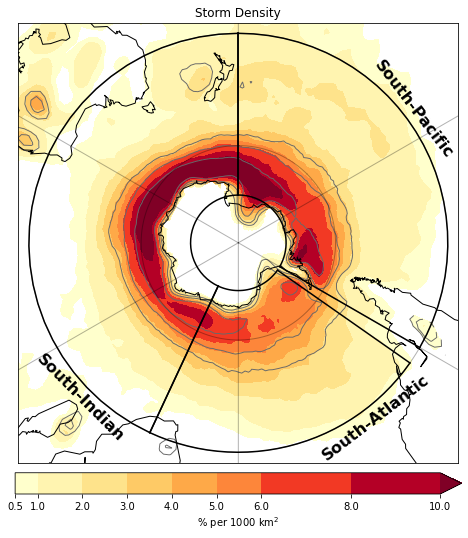

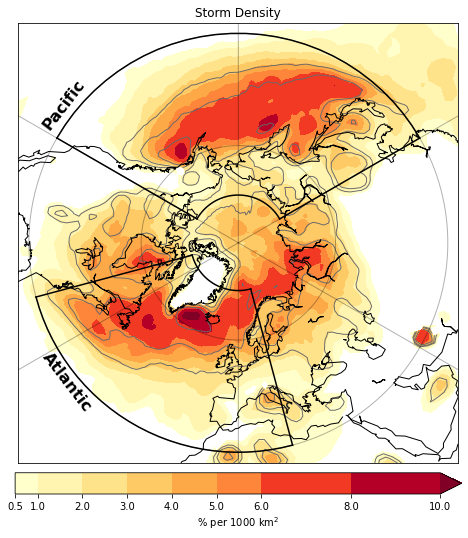

In [37]:
clustchar = "All"
from matplotlib import cm, patheffects
%matplotlib inline

clust_scale = [0,0.5,1.0,2.0,3.0,4.0,5.0,6.0,8.0,10.0] #16.0,20.0,25.0,30.0

genesis_scale = [0,0.2,0.4,0.6,0.8,1.0,1.2] #16.0,20.0,25.0,30.0

normal_scale = [1.0,2.0,4.0,6.0,9.0,12.0,16.0,20.0,25.0,30.0,40.0,50.0] #16.0,20.0,25.0,30.0
imilast_scale = [0.0,2.0,5.0,10.0,15.0,20.0,25.0,35.0,50.0,70.0,100.0]

frac_scale = [5.0,10.0,15.0,20.0,25.0,30.0,35.0,40.0,45.0]

seasons = ["DJF","MAM","JJA","SON"]

plt.figure(figsize=figsize) 


overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey'),           
           fig.map_overlay_latlonbox(-55, 25, -30, -75,color="black"),
           fig.map_overlay_latlonbox(25, 180,-30, -75,color="black"),
           fig.map_overlay_latlonbox(180, 300,-30, -75,color="black"),
           fig.map_overlay_text(-25,-34,"South-Atlantic",rotation=37.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold'), ##5A5A5A"
           fig.map_overlay_text(225,-35,"South-Pacific",rotation=-52.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold'),
           fig.map_overlay_text(53,-19.5,"South-Indian",rotation=-45,fontsize=16,ha='left',va='center',
                                color='black',weight='bold')] 
fig.map(mean_storms_clst_ei[::,::]*100,grid,m=s_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_SH.pdf")


plt.figure(figsize=figsize) 
overlays = [fig.map_overlay_contour(mean_storms_ei[::,::]*100,  grid,title=None,cb_label='% per 1000 km$^2$', 
                                    scale=[10,15,25], linewidths=[0.95,0.95,0.95],
                                   colors='dimgrey'),
           fig.map_overlay_latlonbox(-75, 15, 75, 30,color="black"),
           fig.map_overlay_latlonbox(120, 240, 75, 30,color="black"),
           fig.map_overlay_text(-55,22.5,"Atlantic",rotation=-52.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold'), ##5A5A5A"
           fig.map_overlay_text(235,22.5,"Pacific",rotation=52.5,fontsize=16,ha='left',va='center',
                                color='black',weight='bold')] 

fig.map(mean_storms_clst_ei[::,::]*100,grid,m=n_hemisphere_new,overlays=overlays,mask=(oro[0,::3,::3] >= 1500),maskcolor="white",
title="Storm Density", scale=clust_scale[1:], cmap="YlOrRd", #cmap=cmap_IMILAST, #np.arange(2,12.1,1)
cb_label='% per 1000 km$^2$',extend="max",
save="Plots/Final/Mean_Density_ERA5_Clust_Year_" + formatter.format( Options["timthresh"]) + "_" + clustchar + "_minstorms_" + str(minstorms) + "_connect_NH.pdf")


In [26]:
patheffects.

SyntaxError: invalid syntax (<ipython-input-26-17e74d49e2a5>, line 1)